# Forecasting System - Project Demand of Products at a Retail Outlet Based on Historical Data

# Import Dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.colors as col
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime
import datetime
from pathlib import Path  
import random
import itertools
from statsmodels.tsa.seasonal import seasonal_decompose
from pylab import rcParams
from statsmodels.tsa.stattools import adfuller

# ARIMA Model:

import statsmodels.tsa.api as smt
import statsmodels.api as sm
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import pickle
import warnings

# Data Collection and Analysis

In [2]:
df_train=pd.read_csv("Tcs_train.csv")

In [3]:
df_test=pd.read_csv("Tcs_test.csv")

In [4]:
df_train.head(5)

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [5]:
df_train.tail(5)

,date,store,item,sales
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62
912999,2017-12-31,10,50,82


In [6]:
# Displaying the start and end date for the training set

sd = df_train.date.iloc[0]
ed = df_train.date.iloc[-1]

print("Start Date:", sd)
print("End Date  :", ed)

Start Date: 2013-01-01
End Date  : 2017-12-31


Train data contain datas from 1st january 2013 to 31st dec 2017

In [7]:
df_test.head(5)

,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1


In [8]:
df_test.tail(5)

,id,date,store,item
44995,44995,2018-03-27,10,50
44996,44996,2018-03-28,10,50
44997,44997,2018-03-29,10,50
44998,44998,2018-03-30,10,50
44999,44999,2018-03-31,10,50


In [9]:
# Displaying the start and end date for the testing set

sd = df_test.date.iloc[0]
ed = df_test.date.iloc[-1]

print("Start Date:", sd)
print("End Date  :", ed)

Start Date: 2018-01-01
End Date  : 2018-03-31


Test data contain datas from 1st january 2018 to 31st March 2018

Let's find out what's the time gap between the last day from training set from the last day of the test set, this will be out lag (the amount of day that need to be forecast

Max date from train set: 2017-12-31,
Max date from test set: 2018-03-31,
Forecast lag size : 90

In [10]:
#Check dimensions
print(df_train.shape,df_test.shape)

(913000, 4) (45000, 4)


Analysis and Preprocessing of Train data

In [11]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


In [12]:
df_train.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [13]:
df_train["sales"].describe()

count    913000.000000
mean         52.250287
std          28.801144
min           0.000000
25%          30.000000
50%          47.000000
75%          70.000000
max         231.000000
Name: sales, dtype: float64

Sales data looks unbalanced

<AxesSubplot:>

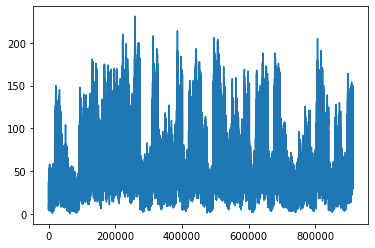

In [14]:
df_train["sales"].plot()

In [15]:
df_train.columns

Index(['date', 'store', 'item', 'sales'], dtype='object')

In [16]:
df_train["store"].nunique()

10

In [17]:
df_train["item"].nunique()

50

In [18]:
df_train["sales"].nunique()

213

We have 10 stores and 50 items

In [19]:
#Statistics of each store

df_train.groupby(["store"]).agg({"sales": ["count", "sum", "mean", "median", "std", "min", "max"]})

sales                                               
       count      sum       mean median        std min  max
store                                                      
1      91300  4315603  47.268379   44.0  24.006252   1  155
2      91300  6120128  67.033165   62.0  33.595810   3  231
3      91300  5435144  59.530602   55.0  29.974102   3  196
4      91300  5012639  54.902946   51.0  27.733097   4  186
5      91300  3631016  39.770164   37.0  20.365757   2  130
6      91300  3627670  39.733516   37.0  20.310451   0  134
7      91300  3320009  36.363735   34.0  18.684825   1  122
8      91300  5856169  64.142048   60.0  32.231751   4  204
9      91300  5025976  55.049025   51.0  27.832186   4  195
10     91300  5360158  58.709288   54.0  29.554994   3  187

In [20]:
#Statistics of each item
df_train.groupby(["item"]).agg({"sales": ["count", "sum", "mean", "median", "std", "min", "max"]})

sales                                               
      count      sum       mean median        std min  max
item                                                      
1     18260   401384  21.981599   21.0   8.468922   1   59
2     18260  1069564  58.574151   56.0  20.093015   9  150
3     18260   669087  36.642223   35.0  13.179441   7  104
4     18260   401907  22.010241   21.0   8.403898   0   66
5     18260   335230  18.358708   18.0   7.265167   1   50
6     18260  1068281  58.503888   56.0  20.174898  11  148
7     18260  1068777  58.531051   56.0  20.146002  11  141
8     18260  1405108  76.950055   74.0  26.130697  15  181
9     18260   938379  51.389869   49.5  17.790158   6  134
10    18260  1337133  73.227437   70.0  24.823725  14  175
11    18260  1271925  69.656353   67.0  23.744732  11  170
12    18260  1271534  69.634940   67.0  23.738663  12  170
13    18260  1539621  84.316594   81.0  28.311031  20  210
14    18260  1071531  58.681873   56.0  20.079860  12  152
15    18260  1607442  88.030778   85.0  29.522852  17  231
16    18260   468480  25.656079   25.0   9.603270   2   70
17    18260   602486  32.994852   32.0  11.967610   4   83
18    18260  1538876  84.275794   81.0  28.430621  18  208
19    18260   736892  40.355531   39.0  14.332645   5   99
20    18260   867641  47.515936   46.0  16.490487   9  127
21    18260   736190  40.317087   39.0  14.338006   7  109
22    18260  1469971  80.502245   78.0  27.118163  14  214
23    18260   534979  29.297864   28.0  10.819549   3   81
24    18260  1205975  66.044633   64.0  22.531555  14  156
25    18260  1473334  80.686418   78.0  27.238817  18  193
26    18260   869981  47.644085   46.0  16.723912   8  119
27    18260   402628  22.049726   21.0   8.461641   1   59
28    18260  1604713  87.881325   85.0  29.501781  16  206
29    18260  1271240  69.618839   67.0  23.635631  15  173
30    18260   736554  40.337021   39.0  14.363331   5  115
31    18260  1070845  58.644304   57.0  20.104705  10  159
32    18260   803107  43.981763   42.0  15.574556   5  119
33    18260  1270183  69.560953   67.0  23.718343  15  169
34    18260   469935  25.735761   25.0   9.617910   2   79
35    18260  1201541  65.801807   63.0  22.461990  12  168
36    18260  1406548  77.028916   74.0  26.067440  16  188
37    18260   534258  29.258379   28.0  10.771547   3   74
38    18260  1470330  80.521906   77.0  27.141799  15  188
39    18260   801311  43.883406   42.0  15.511550   7  112
40    18260   534094  29.249398   28.0  10.822959   3   74
41    18260   401759  22.002136   21.0   8.402470   2   60
42    18260   669925  36.688116   35.0  13.215112   5   96
43    18260   936635  51.294359   49.0  17.801008   9  126
44    18260   536811  29.398193   28.0  10.797738   3   78
45    18260  1471467  80.584173   78.0  27.318402  18  205
46    18260  1070764  58.639869   56.0  20.220879  11  150
47    18260   401781  22.003341   21.0   8.420102   2   61
48    18260   937703  51.352848   49.0  17.881917   8  130
49    18260   535663  29.335323   28.0  10.874788   3   77
50    18260  1203009  65.882202   63.0  22.416031  12  164

In [21]:
df_train.groupby(["store"])["item"].nunique()

store
1     50
2     50
3     50
4     50
5     50
6     50
7     50
8     50
9     50
10    50
Name: item, dtype: int64

Every store has same number of unique items

In [22]:
#Total sales in each store
df_train.groupby(["store"]).agg({"sales": ["sum"]})

,sales
,sum
store,
1,4315603
2,6120128
3,5435144
4,5012639
5,3631016
6,3627670
7,3320009
8,5856169


In [23]:
#How many of these 50 items where sold in these 10 stores
df_train.groupby(["store","item"]).agg({"sales": ["sum","mean","median","std"]})

sales                             
               sum       mean median        std
store item                                     
1     1      36468  19.971522   19.0   6.741022
      2      97050  53.148959   52.0  15.005779
      3      60638  33.208105   33.0  10.072529
      4      36440  19.956188   20.0   6.640618
      5      30335  16.612815   16.0   5.672102
...            ...        ...    ...        ...
10    46    120601  66.046550   65.0  18.114991
      47     45204  24.755750   24.0   7.924820
      48    105570  57.814896   57.0  15.898538
      49     60317  33.032311   32.0  10.091610
      50    135192  74.037240   73.0  19.937566

[500 rows x 4 columns]

In [24]:
#Date column has to be changed into datetime datatype
df_train["date"]=pd.to_datetime(df_train['date'])
df_train.dtypes

date     datetime64[ns]
store             int64
item              int64
sales             int64
dtype: object

In [25]:
#Checking Missing values
df_train.isna().sum()

date     0
store    0
item     0
sales    0
dtype: int64

In [26]:
#Drop store and item columns and Select date and sales only and form a new dataframe for training with date as index
train_data=df_train.drop(["store","item"],axis=1)

In [27]:
train_data.set_index("date")

,sales
date,
2013-01-01,13
2013-01-02,11
2013-01-03,14
2013-01-04,13
2013-01-05,10
...,...
2017-12-27,63
2017-12-28,59
2017-12-29,74


# Data Visualisation

# Total sales per store

In [28]:
#Sales Data Per Store

def total_sales_per_store(df):
    sales_by_store = df.groupby('store')['sales'].sum().reset_index()
    
    fig, ax = plt.subplots(figsize=(10,6))
    sns.barplot(sales_by_store.store, sales_by_store.sales, order=sales_by_store.sort_values('sales',ascending = False).store)
    
    ax.set(xlabel = "Store Id", ylabel = "Sum of Sales", title = "Total Sales Per Store")
    plt.xticks(fontsize=12, rotation=45)
    
    return sales_by_store

,store,sales
0,1,4315603
1,2,6120128
2,3,5435144
3,4,5012639
4,5,3631016
5,6,3627670
6,7,3320009
7,8,5856169
8,9,5025976
9,10,5360158


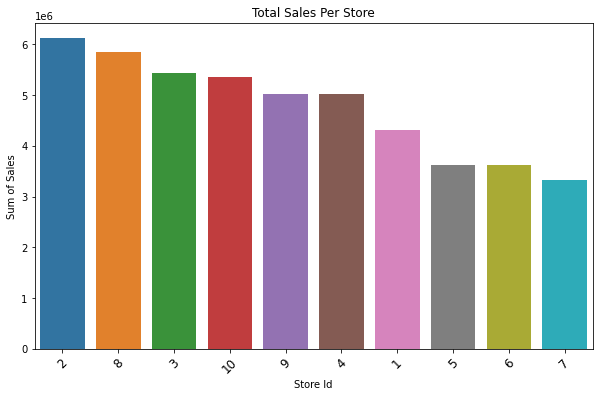

In [29]:
total_sales_per_store(df_train)

In [30]:
#Sales Data Per Item

def total_sales_per_item(df):
    sales_by_store = df.groupby('item')['sales'].sum().reset_index()
    
    fig, ax = plt.subplots(figsize=(20,8))
    sns.barplot(sales_by_store.item, sales_by_store.sales, order=sales_by_store.sort_values('sales', ascending = False).item)
    
    ax.set(xlabel = "Item Id", ylabel = "Sum of Sales", title = "Total Sales Per Item")
    plt.xticks(fontsize=12, rotation=90)
    return

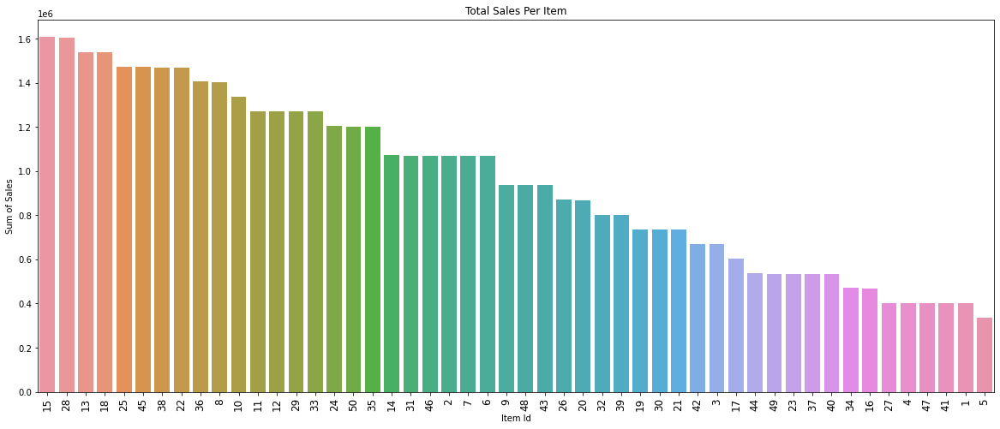

In [31]:
total_sales_per_item(df_train)

In [32]:
item_sales_per_store = df_train.groupby(['store', 'item'])['sales'].sum()
item_sales_per_store

store  item
1      1        36468
       2        97050
       3        60638
       4        36440
       5        30335
                ...  
10     46      120601
       47       45204
       48      105570
       49       60317
       50      135192
Name: sales, Length: 500, dtype: int64

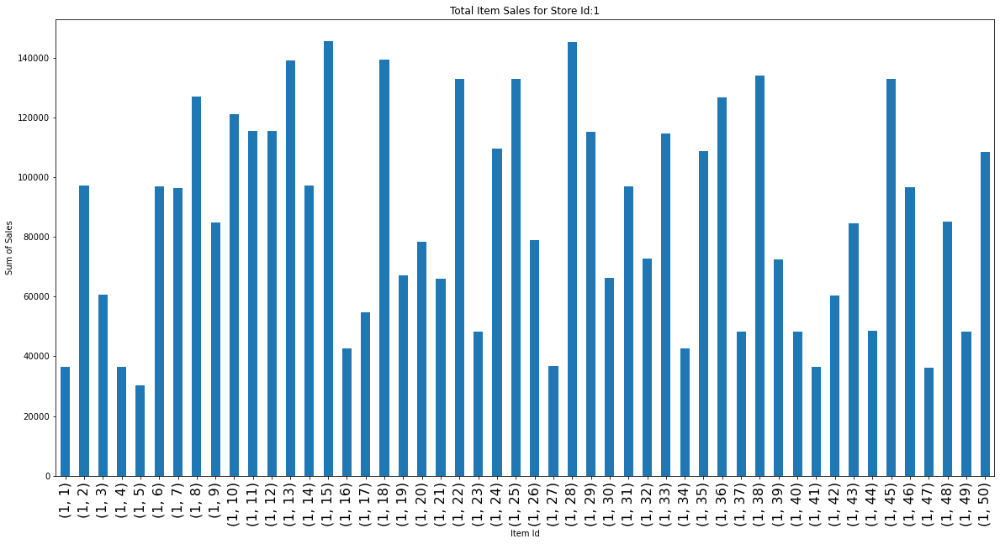

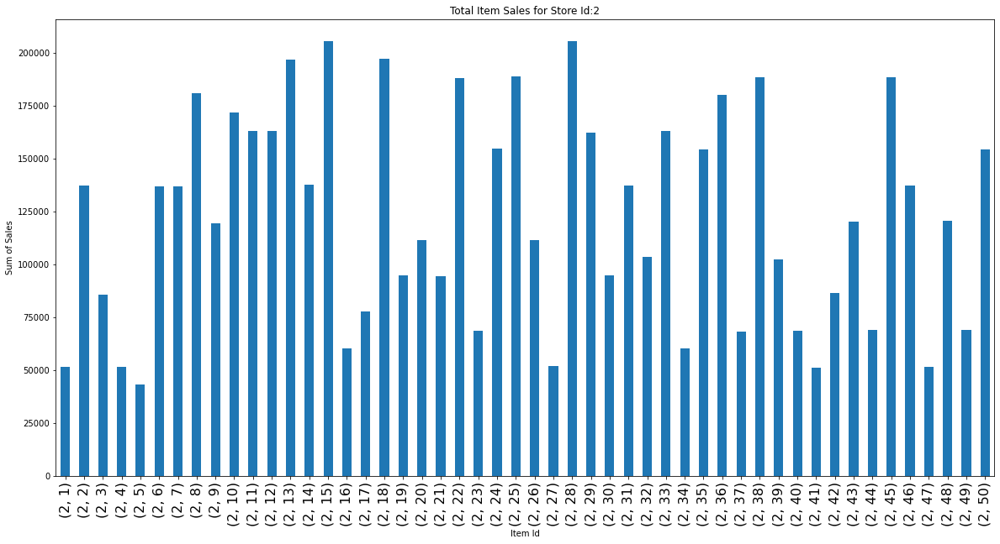

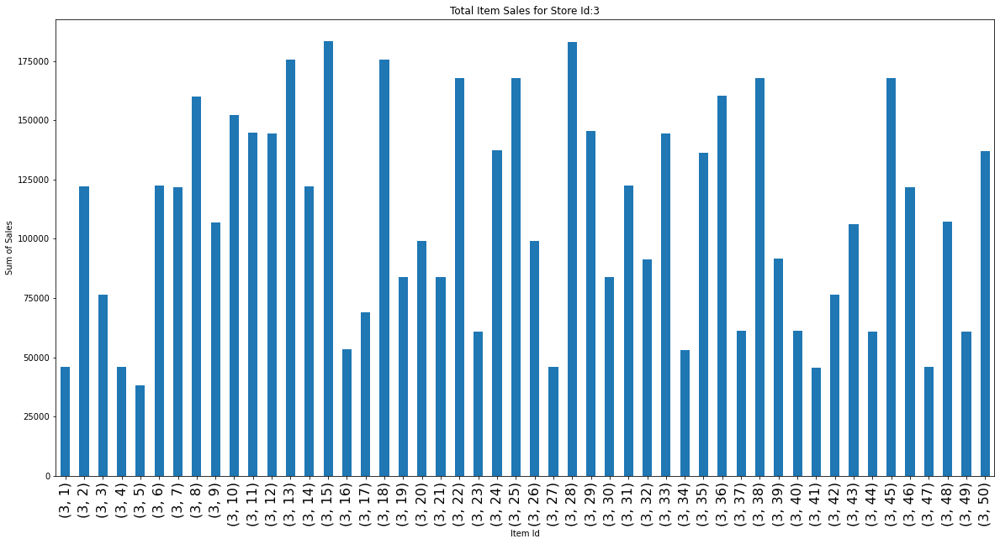

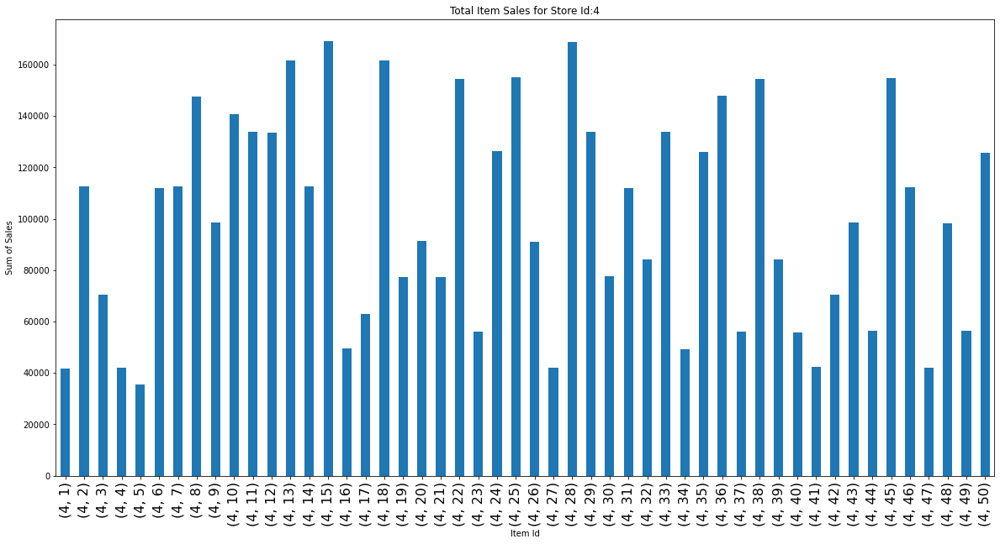

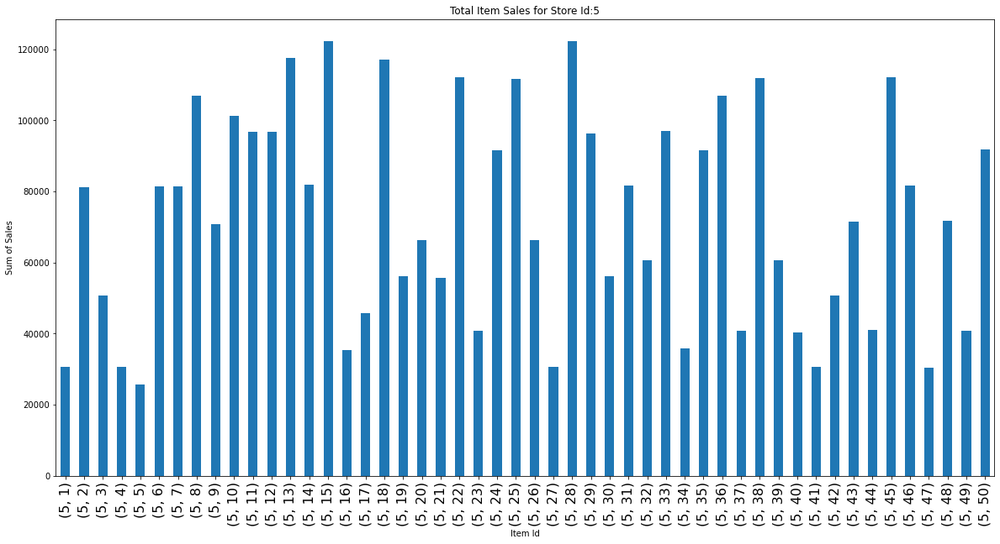

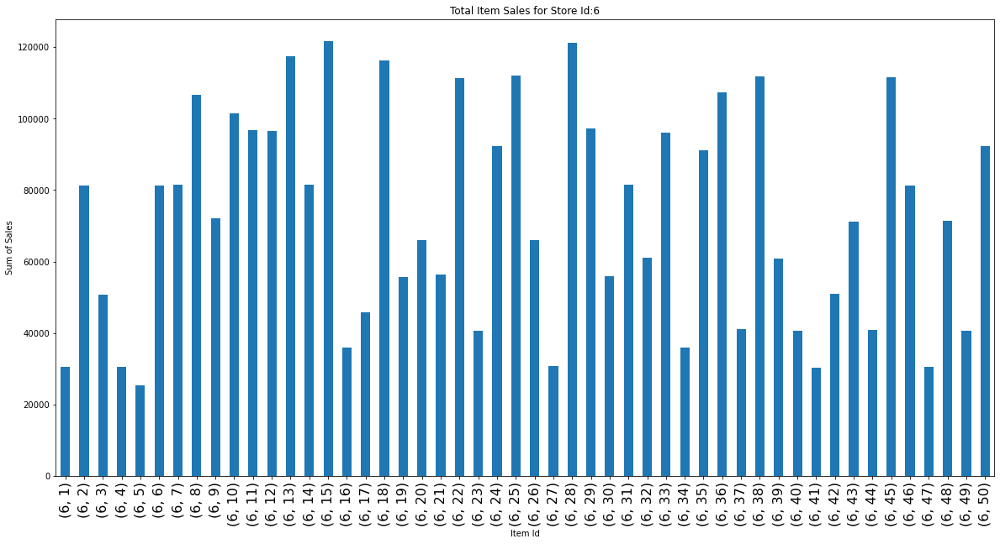

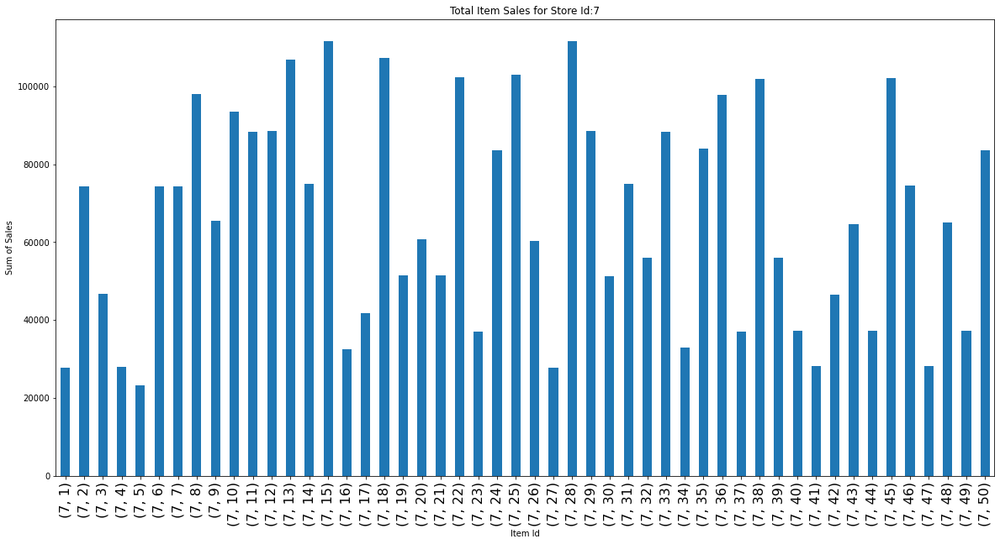

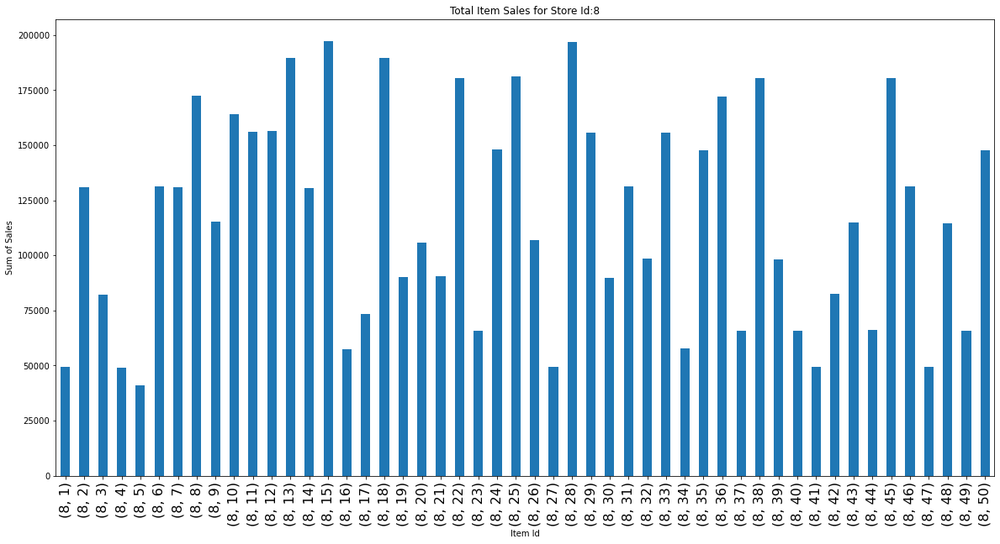

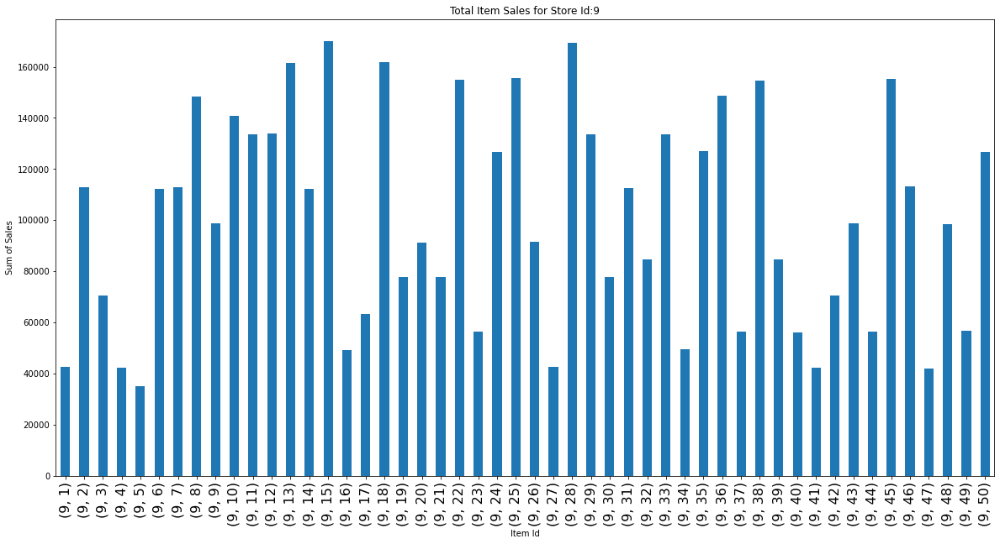

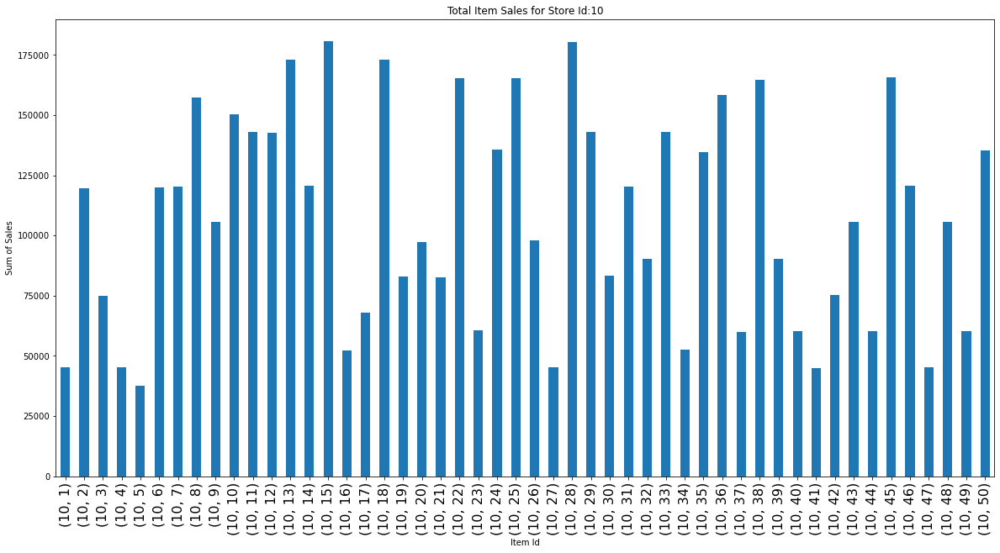

In [33]:
for i in df_train.store.unique():
    plt.figure(figsize=(20,10))
    item_sales_per_store.loc[i,:].plot(kind= "bar")
    plt.xlabel("Item Id"),
    plt.ylabel("Sum of Sales")
    plt.title("Total Item Sales for Store Id:{}".format(i))
    plt.xticks(fontsize=16, rotation=90)
    plt.show();

In [34]:
#other method
item_sales_per_store_df= pd.DataFrame(df_train.groupby(['store', 'item'])['sales'].sum())
item_sales_per_store_df.reset_index(inplace=True)
item_sales_per_store_df

,store,item,sales
0,1,1,36468
1,1,2,97050
2,1,3,60638
3,1,4,36440
4,1,5,30335
...,...,...,...
495,10,46,120601
496,10,47,45204
497,10,48,105570
498,10,49,60317


# Total Item Sales per store

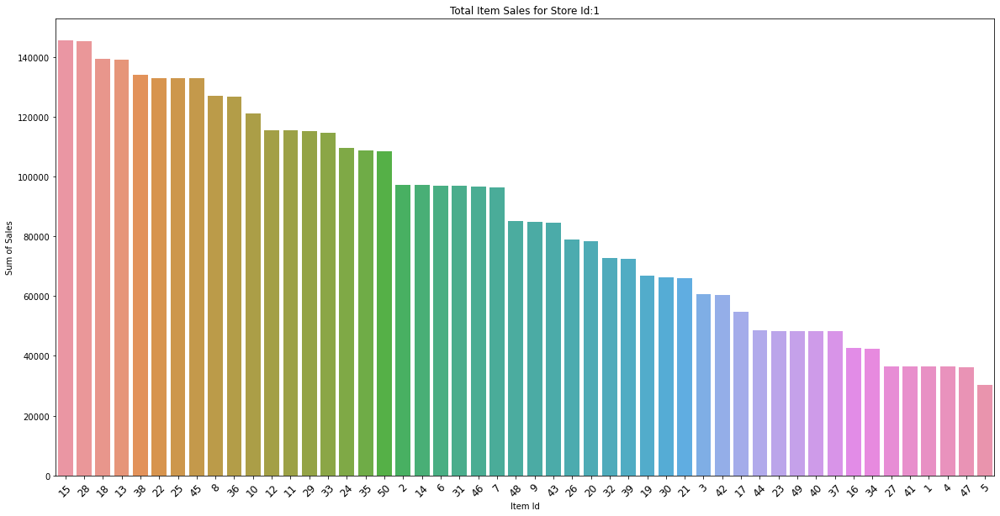

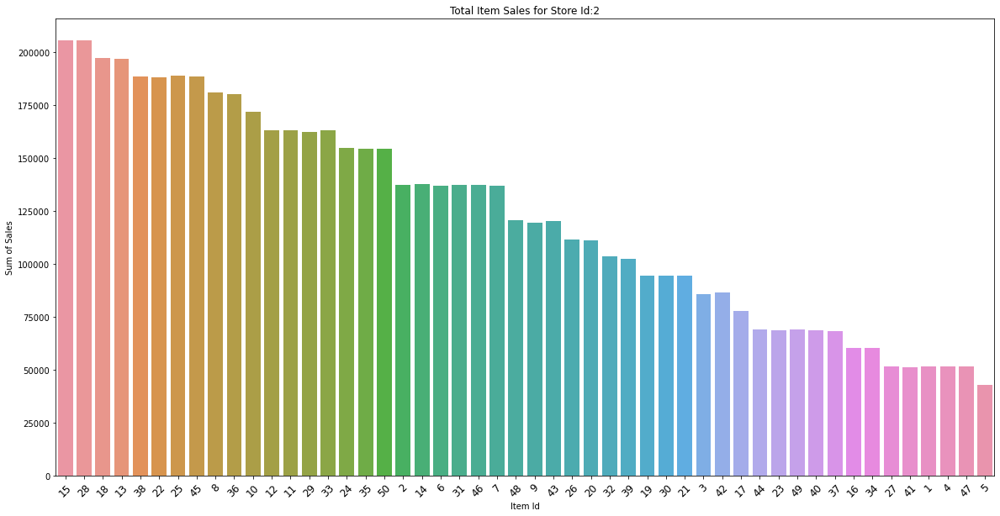

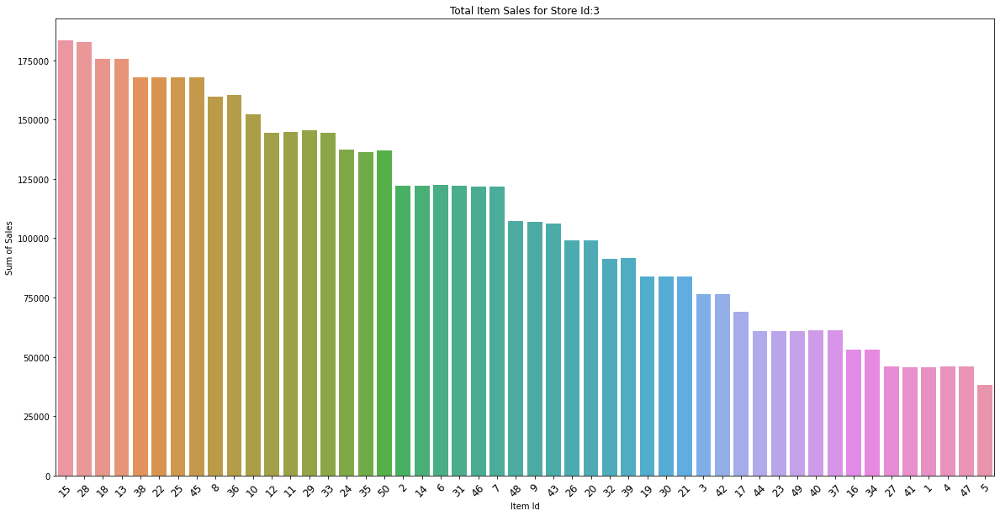

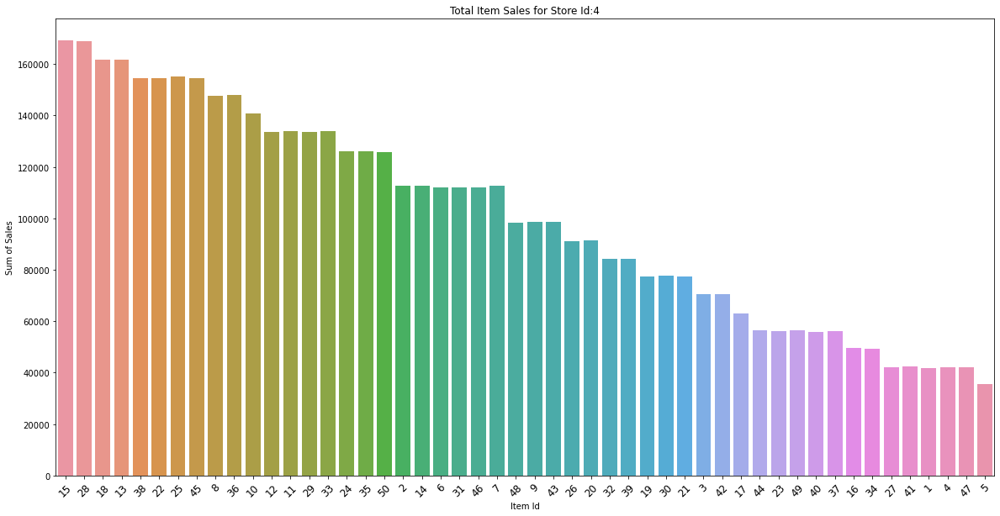

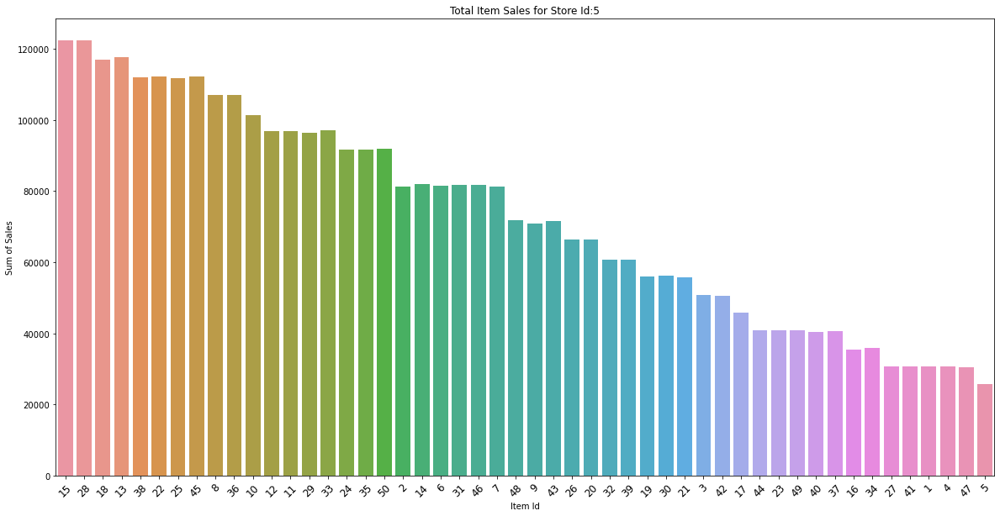

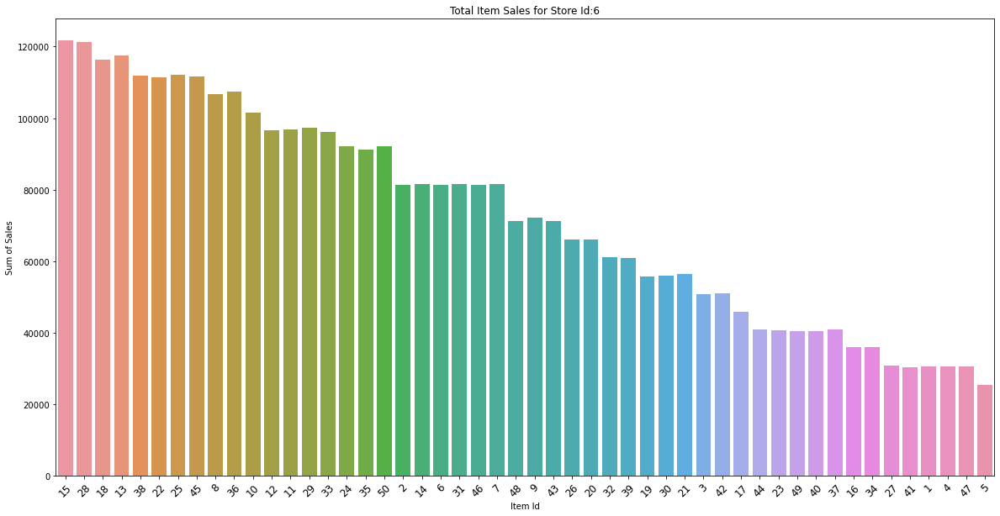

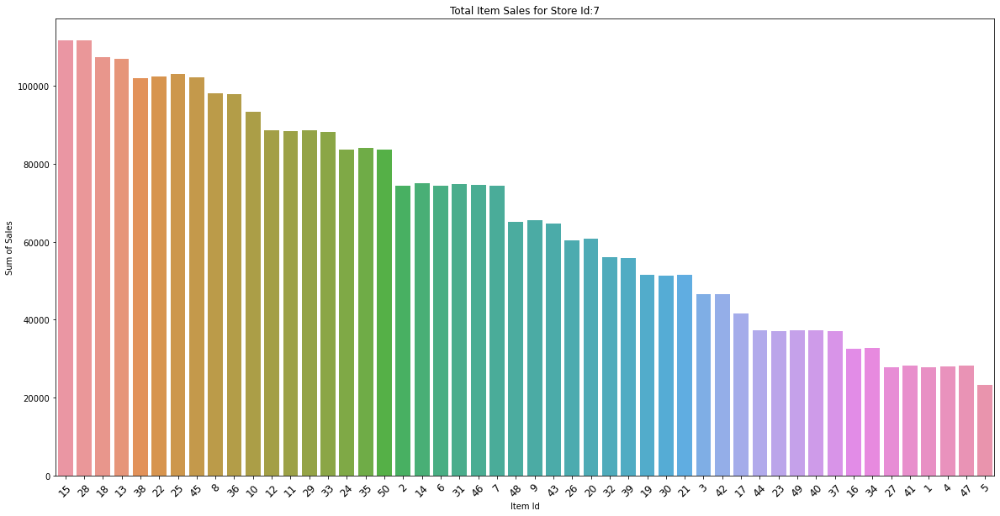

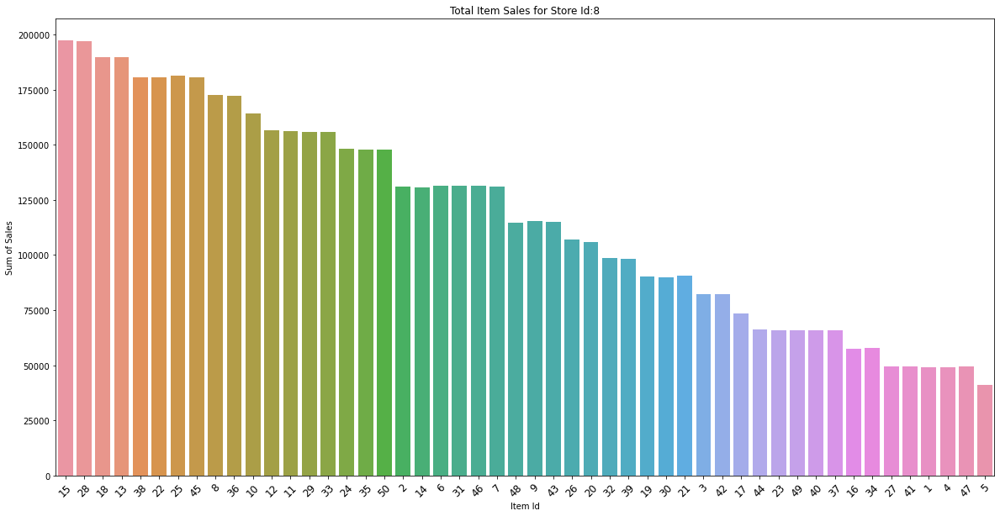

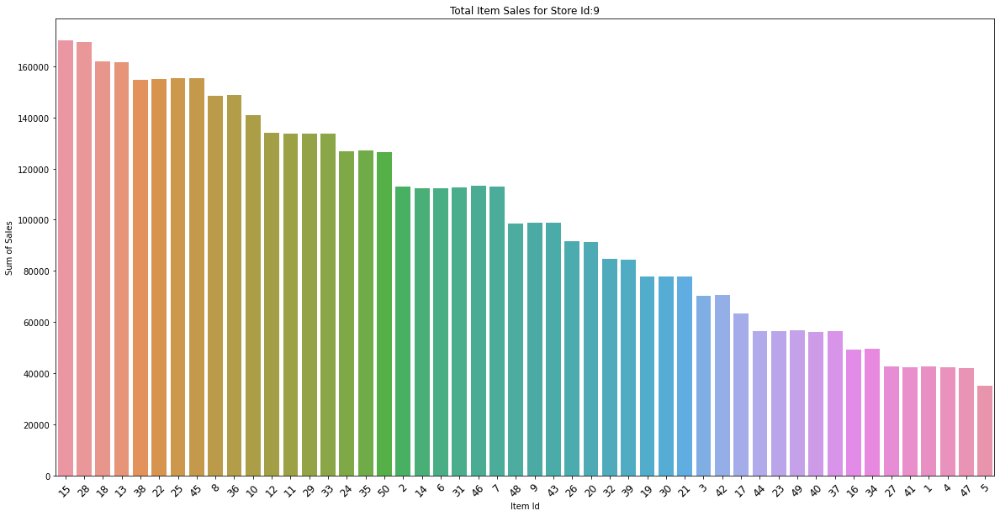

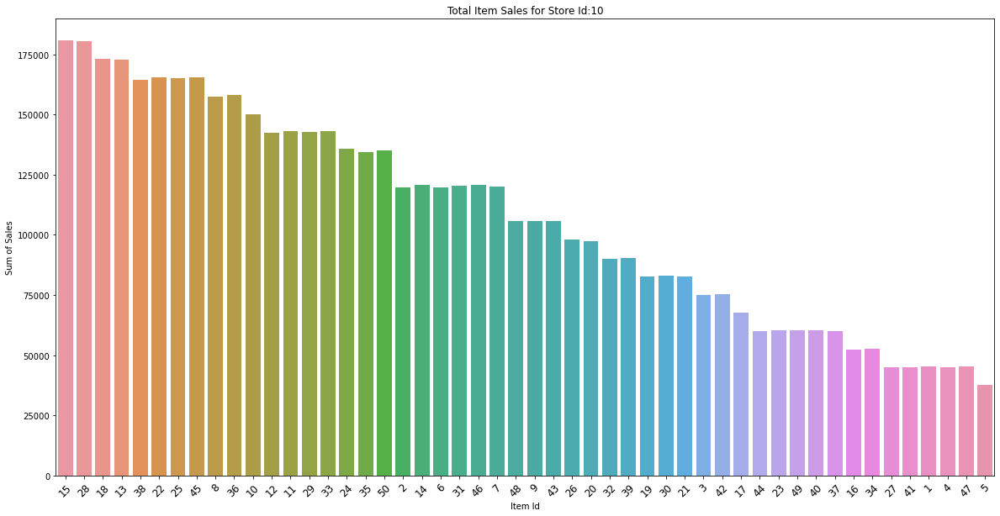

In [35]:
for i in df_train.store.unique():
    plt.figure(figsize=(20,10))
    sns.barplot(x = 'item', y = 'sales', data= item_sales_per_store_df.loc[item_sales_per_store_df.store==i], 
                order=item_sales_per_store_df.loc[item_sales_per_store_df.store==1].sort_values('sales', ascending = False).item)
    plt.xlabel("Item Id"),
    plt.ylabel("Sum of Sales")
    plt.title("Total Item Sales for Store Id:{}".format(i))
    plt.xticks(fontsize=12, rotation=45)
    plt.show();

# Create the total daily, monthly and annual sales data frames:

In [36]:
#Daily total sales:

data_day_sum= df_train.resample('D', on='date').sum()
data_day_sum.index= pd.to_datetime(data_day_sum.index).strftime('%Y-%m-%d')
data_day_sum['date']= data_day_sum.index
data_day_sum= pd.DataFrame(data_day_sum[['date','sales']])
data_day_sum= data_day_sum.reset_index(level=0, drop=True)
print("Daily sales:",data_day_sum.head(5))

#Mean of daily total sales
data_day_mean= df_train.resample('D', on='date').mean()
data_day_mean.index= pd.to_datetime(data_day_mean.index).strftime('%Y-%m-%d')
data_day_mean['date']= data_day_mean.index
data_day_mean= pd.DataFrame(data_day_mean[['date',"sales"]])
data_day_mean= data_day_mean.reset_index(level=0, drop=True)
print("Mean daily sales:", data_day_mean.head())

#Montly total sales:
data_month_sum= df_train.resample('M', on='date').sum()
data_month_sum.index= pd.to_datetime(data_month_sum.index).strftime('%Y-%m')
data_month_sum['year_month']= data_month_sum.index
data_month_sum= pd.DataFrame(data_month_sum[['year_month',"sales"]])
data_month_sum= data_month_sum.reset_index(level=0, drop=True)
print("Monthly sales:", data_month_sum.head())

#Mean of monthly total sales
data_month_mean= df_train.resample('M', on='date').mean()
data_month_mean.index= pd.to_datetime(data_month_mean.index).strftime('%Y-%m')
data_month_mean['year_month']= data_month_mean.index
data_month_mean= pd.DataFrame(data_month_mean[['year_month',"sales"]])
data_month_mean= data_month_mean.reset_index(level=0, drop=True)
print("Mean monthly sales:", data_month_mean.head())

#Annual total sales:
data_year_sum= df_train.resample('Y', on='date').sum()
data_year_sum.index= pd.to_datetime(data_year_sum.index).strftime('%Y')
data_year_sum['year']= data_year_sum.index
data_year_sum= pd.DataFrame(data_year_sum[['year',"sales"]])
data_year_sum= data_year_sum.reset_index(level=0, drop=True)
print("Yearly sales:", data_year_sum.head())

#Mean of annual total sales
data_year_mean= df_train.resample('Y', on='date').mean()
data_year_mean.index= pd.to_datetime(data_year_mean.index).strftime('%Y')
data_year_mean['year']= data_year_mean.index
data_year_mean= pd.DataFrame(data_year_mean[['year',"sales"]])
data_year_mean= data_year_mean.reset_index(level=0, drop=True)
print("Mean Yearly sales:",data_year_mean.head())

Daily sales:          date  sales
0  2013-01-01  13696
1  2013-01-02  13678
2  2013-01-03  14488
3  2013-01-04  15677
4  2013-01-05  16237
Mean daily sales:          date   sales
0  2013-01-01  27.392
1  2013-01-02  27.356
2  2013-01-03  28.976
3  2013-01-04  31.354
4  2013-01-05  32.474
Monthly sales:   year_month   sales
0    2013-01  454904
1    2013-02  459417
2    2013-03  617382
3    2013-04  682274
4    2013-05  763242
Mean monthly sales:   year_month      sales
0    2013-01  29.348645
1    2013-02  32.815500
2    2013-03  39.831097
3    2013-04  45.484933
4    2013-05  49.241419
Yearly sales:    year     sales
0  2013   7941243
1  2014   9135482
2  2015   9536887
3  2016  10357160
4  2017  10733740
Mean Yearly sales:    year      sales
0  2013  43.513660
1  2014  50.057436
2  2015  52.256915
3  2016  56.596503
4  2017  58.815014


# Monthly, Quarterly and Yearly Resampling with Sales mean

Visualisation of monthly sales for every store by resampling monthly sales mean

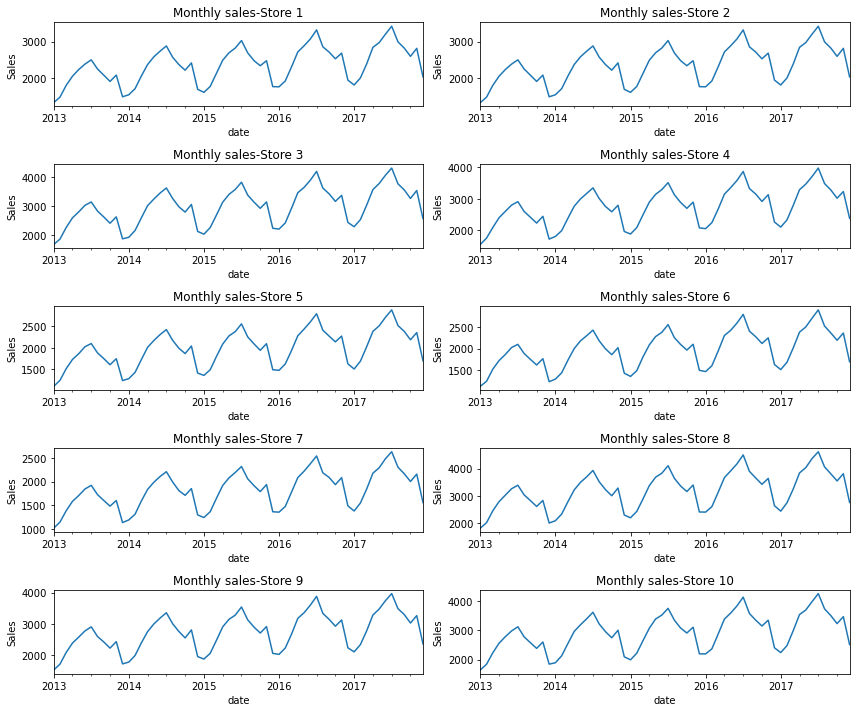

In [37]:
store1= df_train.loc[df_train['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1 = store1.set_index('date')
store1_m = store1['sales'].resample('MS').mean()

store2= df_train.loc[df_train['store'] == 2]
store2= store2.sort_values('date')
store2= store2.set_index('date')
store2 = store2.groupby('date')['sales'].sum().reset_index()
store2 = store2.set_index('date')
store2_m = store1['sales'].resample('MS').mean()

store3= df_train.loc[df_train['store'] == 3]
store3= store3.sort_values('date')
store3= store3.set_index('date')
store3 = store3.groupby('date')['sales'].sum().reset_index()
store3 = store3.set_index('date')
store3_m = store3['sales'].resample('MS').mean()

store4= df_train.loc[df_train['store'] == 4]
store4= store4.sort_values('date')
store4= store4.set_index('date')
store4 = store4.groupby('date')['sales'].sum().reset_index()
store4 = store4.set_index('date')
store4_m = store4['sales'].resample('MS').mean()

store5= df_train.loc[df_train['store'] == 5]
store5= store5.sort_values('date')
store5= store5.set_index('date')
store5 = store5.groupby('date')['sales'].sum().reset_index()
store5 = store5.set_index('date')
store5_m = store5['sales'].resample('MS').mean()


store6= df_train.loc[df_train['store'] == 6]
store6= store6.sort_values('date')
store6= store6.set_index('date')
store6 = store6.groupby('date')['sales'].sum().reset_index()
store6 = store6.set_index('date')
store6_m = store6['sales'].resample('MS').mean()


store7= df_train.loc[df_train['store'] == 7]
store7= store7.sort_values('date')
store7= store7.set_index('date')
store7 = store7.groupby('date')['sales'].sum().reset_index()
store7 = store7.set_index('date')
store7_m = store7['sales'].resample('MS').mean()


store8= df_train.loc[df_train['store'] == 8]
store8= store8.sort_values('date')
store8= store8.set_index('date')
store8 = store8.groupby('date')['sales'].sum().reset_index()
store8 = store8.set_index('date')
store8_m = store8['sales'].resample('MS').mean()

store9= df_train.loc[df_train['store'] == 9]
store9= store9.sort_values('date')
store9= store9.set_index('date')
store9 = store9.groupby('date')['sales'].sum().reset_index()
store9 = store9.set_index('date')
store9_m = store9['sales'].resample('MS').mean()

store10= df_train.loc[df_train['store'] == 10]
store10= store10.sort_values('date')
store10= store10.set_index('date')
store10 = store10.groupby('date')['sales'].sum().reset_index()
store10 = store10.set_index('date')
store10_m = store10['sales'].resample('MS').mean()

plt.figure(figsize=(12,10))
plt.subplot(5,2,1)
store1_m.plot()
plt.title("Monthly sales-Store 1")
plt.ylabel("Sales")

plt.subplot(5,2,2)
store2_m.plot()
plt.title("Monthly sales-Store 2")
plt.ylabel("Sales")

plt.subplot(5,2,3)
store3_m.plot()
plt.title("Monthly sales-Store 3")
plt.ylabel("Sales")

plt.subplot(5,2,4)
store4_m.plot()
plt.title("Monthly sales-Store 4")
plt.ylabel("Sales")

plt.subplot(5,2,5)
store5_m.plot()
plt.title("Monthly sales-Store 5")
plt.ylabel("Sales")

plt.subplot(5,2,6)
store6_m.plot()
plt.title("Monthly sales-Store 6")
plt.ylabel("Sales")

plt.subplot(5,2,7)
store7_m.plot()
plt.title("Monthly sales-Store 7")
plt.ylabel("Sales")

plt.subplot(5,2,8)
store8_m.plot()
plt.title("Monthly sales-Store 8")
plt.ylabel("Sales")

plt.subplot(5,2,9)
store9_m.plot()
plt.title("Monthly sales-Store 9")
plt.ylabel("Sales")

plt.subplot(5,2,10)
store10_m.plot()
plt.title("Monthly sales-Store 10")
plt.ylabel("Sales")
plt.tight_layout()

Visualisation of yearly sales for every store by resampling with yearly sales mean

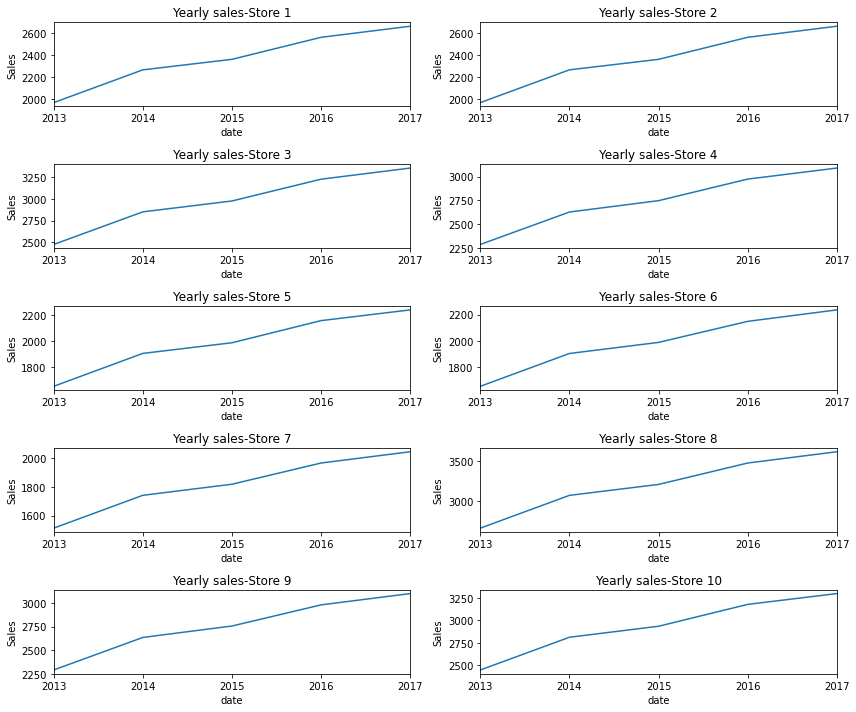

In [38]:
store1= df_train.loc[df_train['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1 = store1.set_index('date')
store1_y = store1['sales'].resample('Y').mean()

store2= df_train.loc[df_train['store'] == 2]
store2= store2.sort_values('date')
store2= store2.set_index('date')
store2 = store2.groupby('date')['sales'].sum().reset_index()
store2 = store2.set_index('date')
store2_y = store1['sales'].resample('Y').mean()

store3= df_train.loc[df_train['store'] == 3]
store3= store3.sort_values('date')
store3= store3.set_index('date')
store3 = store3.groupby('date')['sales'].sum().reset_index()
store3 = store3.set_index('date')
store3_y = store3['sales'].resample('Y').mean()

store4= df_train.loc[df_train['store'] == 4]
store4= store4.sort_values('date')
store4= store4.set_index('date')
store4 = store4.groupby('date')['sales'].sum().reset_index()
store4 = store4.set_index('date')
store4_y = store4['sales'].resample('Y').mean()

store5= df_train.loc[df_train['store'] == 5]
store5= store5.sort_values('date')
store5= store5.set_index('date')
store5 = store5.groupby('date')['sales'].sum().reset_index()
store5 = store5.set_index('date')
store5_y = store5['sales'].resample('Y').mean()


store6= df_train.loc[df_train['store'] == 6]
store6= store6.sort_values('date')
store6= store6.set_index('date')
store6 = store6.groupby('date')['sales'].sum().reset_index()
store6 = store6.set_index('date')
store6_y = store6['sales'].resample('Y').mean()


store7= df_train.loc[df_train['store'] == 7]
store7= store7.sort_values('date')
store7= store7.set_index('date')
store7 = store7.groupby('date')['sales'].sum().reset_index()
store7 = store7.set_index('date')
store7_y = store7['sales'].resample('Y').mean()


store8= df_train.loc[df_train['store'] == 8]
store8= store8.sort_values('date')
store8= store8.set_index('date')
store8 = store8.groupby('date')['sales'].sum().reset_index()
store8 = store8.set_index('date')
store8_y = store8['sales'].resample('Y').mean()

store9= df_train.loc[df_train['store'] == 9]
store9= store9.sort_values('date')
store9= store9.set_index('date')
store9 = store9.groupby('date')['sales'].sum().reset_index()
store9 = store9.set_index('date')
store9_y = store9['sales'].resample('Y').mean()

store10= df_train.loc[df_train['store'] == 10]
store10= store10.sort_values('date')
store10= store10.set_index('date')
store10 = store10.groupby('date')['sales'].sum().reset_index()
store10 = store10.set_index('date')
store10_y = store10['sales'].resample('Y').mean()

plt.figure(figsize=(12,10))
plt.subplot(5,2,1)
store1_y.plot()
plt.title("Yearly sales-Store 1")
plt.ylabel("Sales")

plt.subplot(5,2,2)
store2_y.plot()
plt.title("Yearly sales-Store 2")
plt.ylabel("Sales")

plt.subplot(5,2,3)
store3_y.plot()
plt.title("Yearly sales-Store 3")
plt.ylabel("Sales")

plt.subplot(5,2,4)
store4_y.plot()
plt.title("Yearly sales-Store 4")
plt.ylabel("Sales")

plt.subplot(5,2,5)
store5_y.plot()
plt.title("Yearly sales-Store 5")
plt.ylabel("Sales")

plt.subplot(5,2,6)
store6_y.plot()
plt.title("Yearly sales-Store 6")
plt.ylabel("Sales")

plt.subplot(5,2,7)
store7_y.plot()
plt.title("Yearly sales-Store 7")
plt.ylabel("Sales")

plt.subplot(5,2,8)
store8_y.plot()
plt.title("Yearly sales-Store 8")
plt.ylabel("Sales")

plt.subplot(5,2,9)
store9_y.plot()
plt.title("Yearly sales-Store 9")
plt.ylabel("Sales")

plt.subplot(5,2,10)
store10_y.plot()
plt.title("Yearly sales-Store 10")
plt.ylabel("Sales")
plt.tight_layout()

Visualisation of quarterly sales for every store by resampling with quarterly sales mean

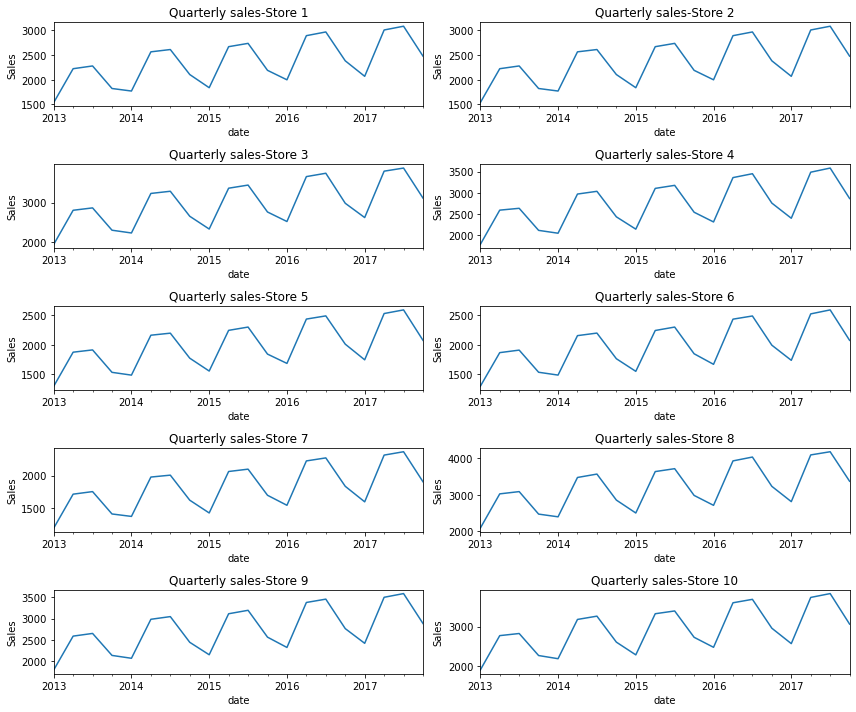

In [39]:
store1= df_train.loc[df_train['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1 = store1.set_index('date')
store1_q = store1['sales'].resample('Q').mean()

store2= df_train.loc[df_train['store'] == 2]
store2= store2.sort_values('date')
store2= store2.set_index('date')
store2 = store2.groupby('date')['sales'].sum().reset_index()
store2 = store2.set_index('date')
store2_q = store1['sales'].resample('Q').mean()

store3= df_train.loc[df_train['store'] == 3]
store3= store3.sort_values('date')
store3= store3.set_index('date')
store3 = store3.groupby('date')['sales'].sum().reset_index()
store3 = store3.set_index('date')
store3_q = store3['sales'].resample('Q').mean()

store4= df_train.loc[df_train['store'] == 4]
store4= store4.sort_values('date')
store4= store4.set_index('date')
store4 = store4.groupby('date')['sales'].sum().reset_index()
store4 = store4.set_index('date')
store4_q = store4['sales'].resample('Q').mean()

store5= df_train.loc[df_train['store'] == 5]
store5= store5.sort_values('date')
store5= store5.set_index('date')
store5 = store5.groupby('date')['sales'].sum().reset_index()
store5 = store5.set_index('date')
store5_q = store5['sales'].resample('Q').mean()

store6= df_train.loc[df_train['store'] == 6]
store6= store6.sort_values('date')
store6= store6.set_index('date')
store6 = store6.groupby('date')['sales'].sum().reset_index()
store6 = store6.set_index('date')
store6_q = store6['sales'].resample('Q').mean()

store7= df_train.loc[df_train['store'] == 7]
store7= store7.sort_values('date')
store7= store7.set_index('date')
store7 = store7.groupby('date')['sales'].sum().reset_index()
store7 = store7.set_index('date')
store7_q = store7['sales'].resample('Q').mean()

store8= df_train.loc[df_train['store'] == 8]
store8= store8.sort_values('date')
store8= store8.set_index('date')
store8 = store8.groupby('date')['sales'].sum().reset_index()
store8 = store8.set_index('date')
store8_q = store8['sales'].resample('Q').mean()

store9= df_train.loc[df_train['store'] == 9]
store9= store9.sort_values('date')
store9= store9.set_index('date')
store9 = store9.groupby('date')['sales'].sum().reset_index()
store9 = store9.set_index('date')
store9_q = store9['sales'].resample('Q').mean()

store10= df_train.loc[df_train['store'] == 10]
store10= store10.sort_values('date')
store10= store10.set_index('date')
store10 = store10.groupby('date')['sales'].sum().reset_index()
store10 = store10.set_index('date')
store10_q = store10['sales'].resample('Q').mean()

plt.figure(figsize=(12,10))
plt.subplot(5,2,1)
store1_q.plot()
plt.title("Quarterly sales-Store 1")
plt.ylabel("Sales")

plt.subplot(5,2,2)
store2_q.plot()
plt.title("Quarterly sales-Store 2")
plt.ylabel("Sales")

plt.subplot(5,2,3)
store3_q.plot()
plt.title("Quarterly sales-Store 3")
plt.ylabel("Sales")

plt.subplot(5,2,4)
store4_q.plot()
plt.title("Quarterly sales-Store 4")
plt.ylabel("Sales")

plt.subplot(5,2,5)
store5_q.plot()
plt.title("Quarterly sales-Store 5")
plt.ylabel("Sales")

plt.subplot(5,2,6)
store6_q.plot()
plt.title("Quarterly sales-Store 6")
plt.ylabel("Sales")

plt.subplot(5,2,7)
store7_q.plot()
plt.title("Quarterly sales-Store 7")
plt.ylabel("Sales")

plt.subplot(5,2,8)
store8_q.plot()
plt.title("Quarterly sales-Store 8")
plt.ylabel("Sales")

plt.subplot(5,2,9)
store9_q.plot()
plt.title("Quarterly sales-Store 9")
plt.ylabel("Sales")

plt.subplot(5,2,10)
store10_q.plot()
plt.title("Quarterly sales-Store 10")
plt.ylabel("Sales")
plt.tight_layout()

From the monthly sale of each store, it is evident that the sale follows a trend every month and yearly plot of each store clearly depicts a trend in the sale which is upward in direction.

In [40]:
#timeseries data splitting into day date month
df_train1 = df_train.copy()
df_train1['day'] = df_train['date'].dt.day
df_train1['month'] = df_train['date'].dt.month
df_train1['year'] = df_train['date'].dt.year
df_train1

,date,store,item,sales,day,month,year
0,2013-01-01,1,1,13,1,1,2013
1,2013-01-02,1,1,11,2,1,2013
2,2013-01-03,1,1,14,3,1,2013
3,2013-01-04,1,1,13,4,1,2013
4,2013-01-05,1,1,10,5,1,2013
...,...,...,...,...,...,...,...
912995,2017-12-27,10,50,63,27,12,2017
912996,2017-12-28,10,50,59,28,12,2017
912997,2017-12-29,10,50,74,29,12,2017
912998,2017-12-30,10,50,62,30,12,2017


# Visualisation of sales of each item in every year

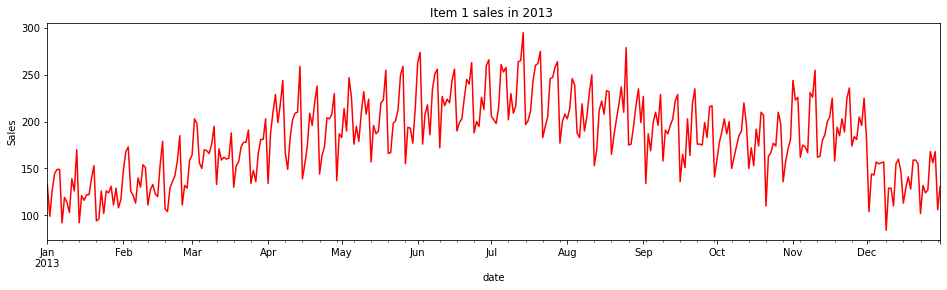

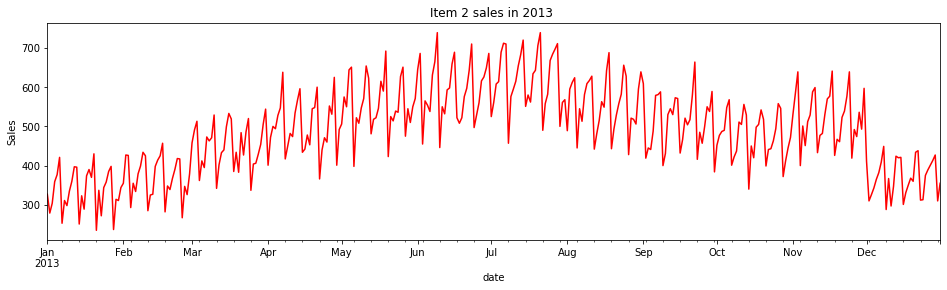

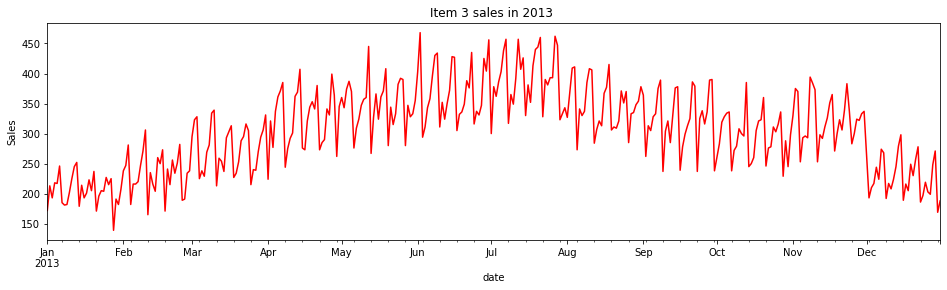

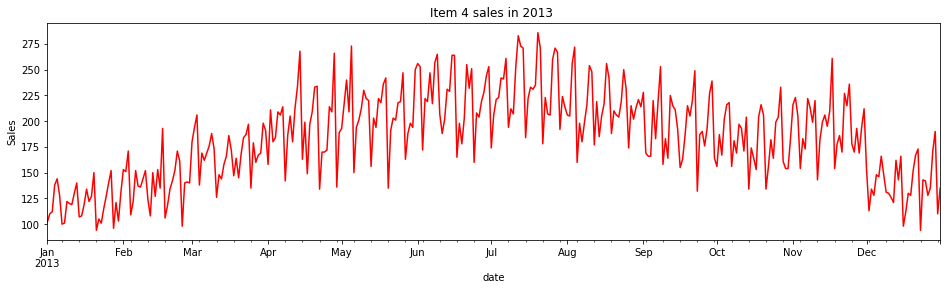

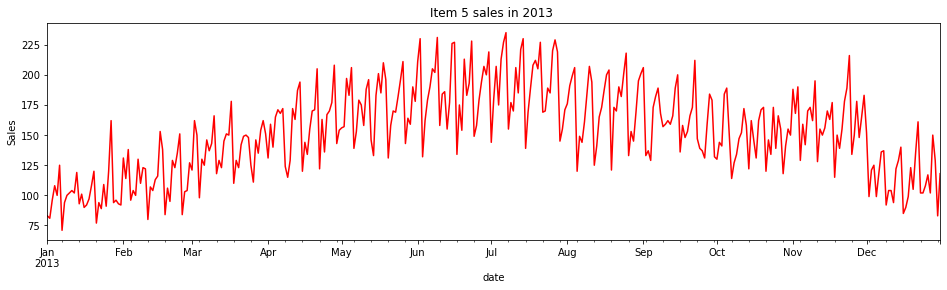

...

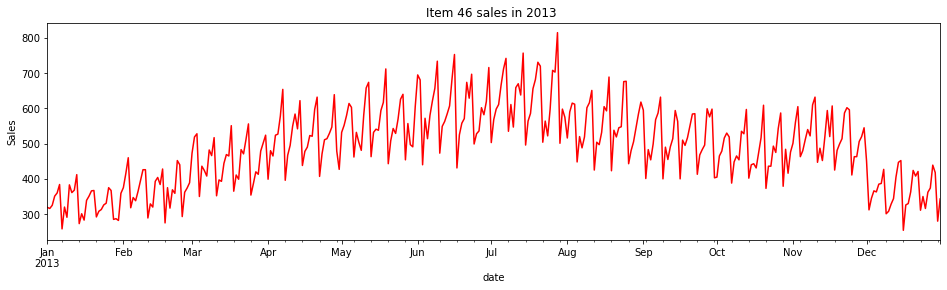

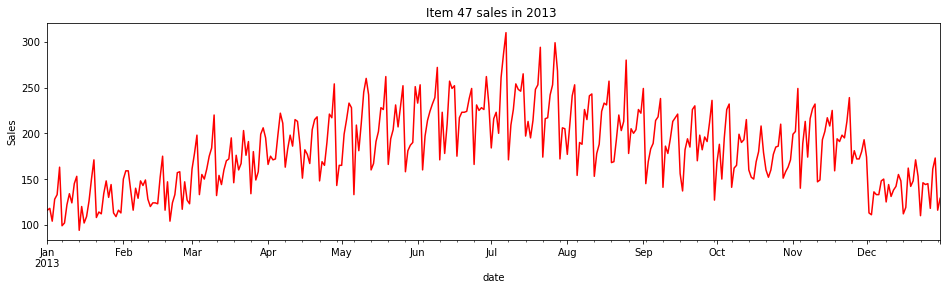

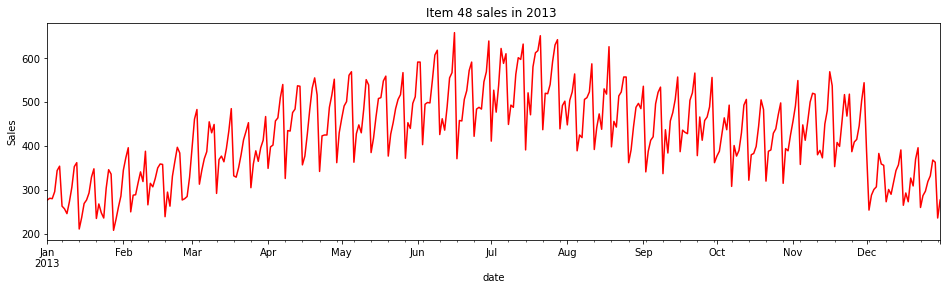

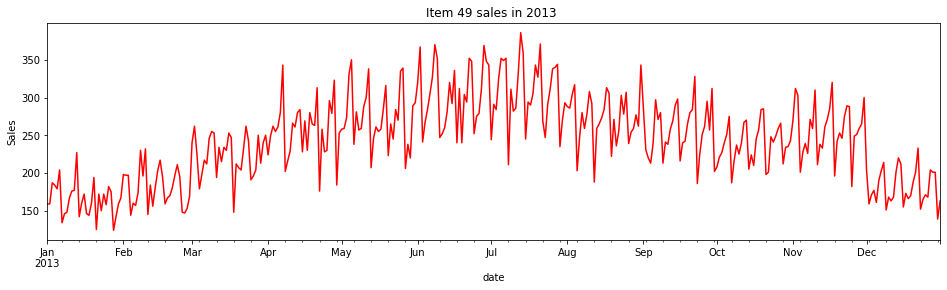

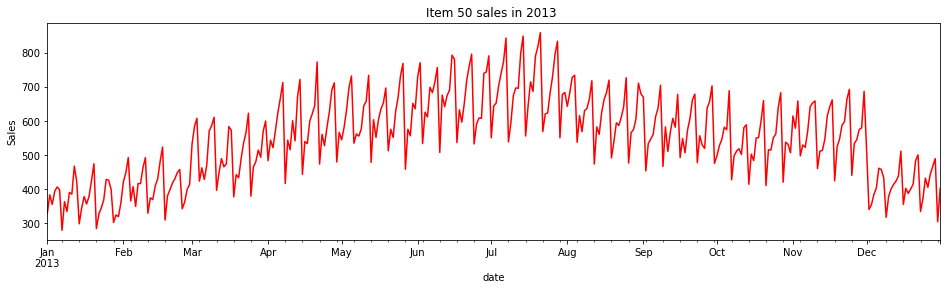

In [41]:
for i in df_train['item'].unique():
    item1_2013= df_train1.loc[(df_train['item'] == i) & (df_train1['year']==2013)]
    item1_2013 = item1_2013.groupby(['date','item'])['sales'].sum().reset_index()
    item1_2013 = item1_2013.set_index('date')
    item1_d_2013 = item1_2013['sales'].resample('D').mean()
    item1_d_2013.plot(figsize=(16,4),color='red')
    plt.title(f"Item {i} sales in 2013 ")
    plt.ylabel("Sales")
    plt.show()

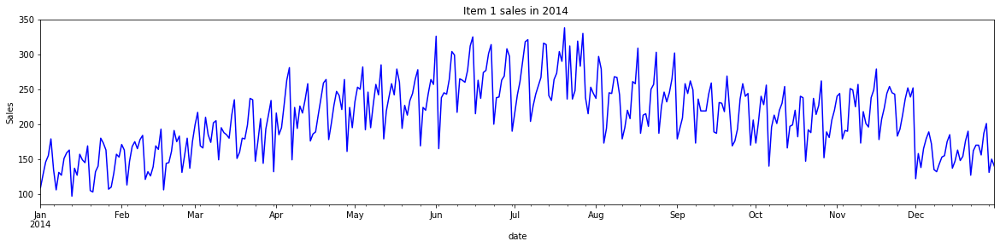

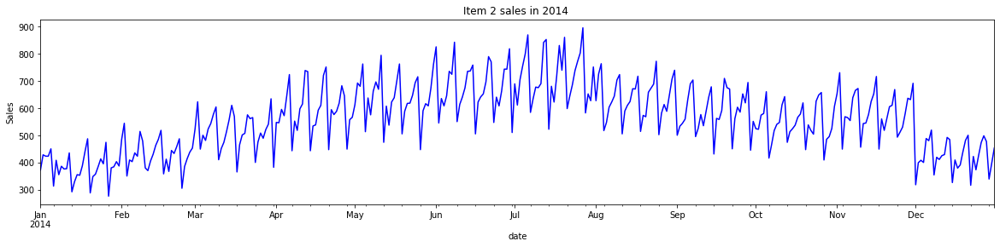

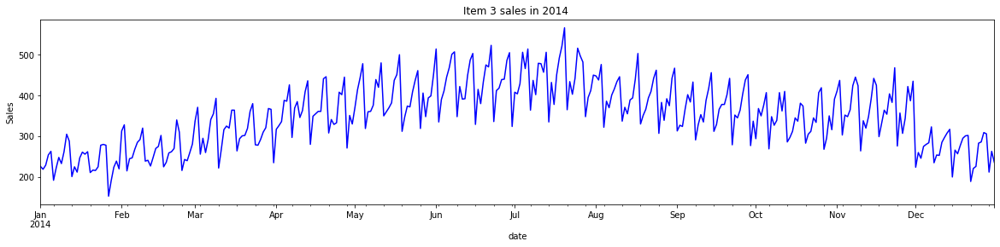

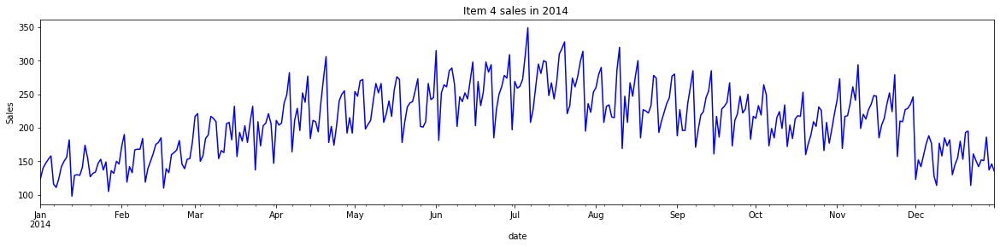

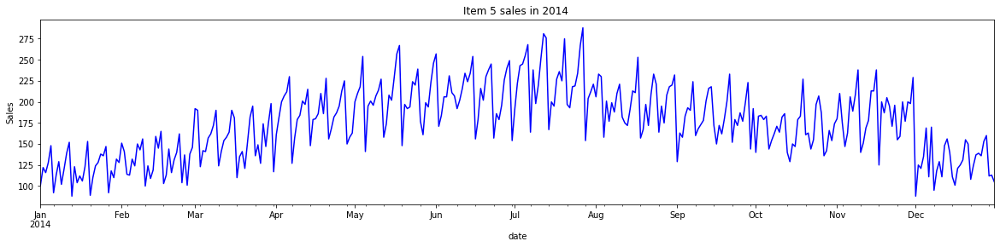

...

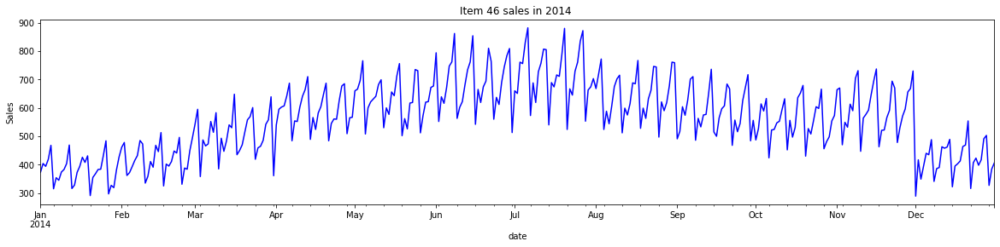

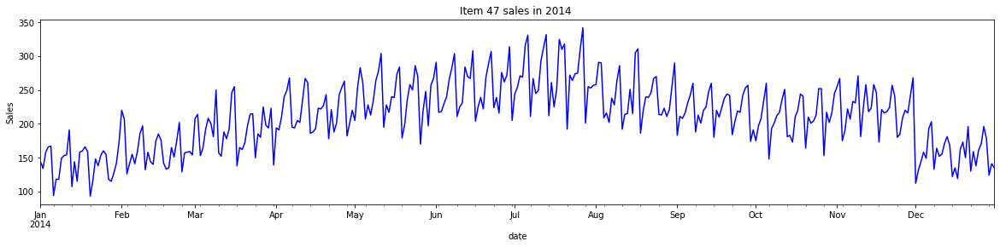

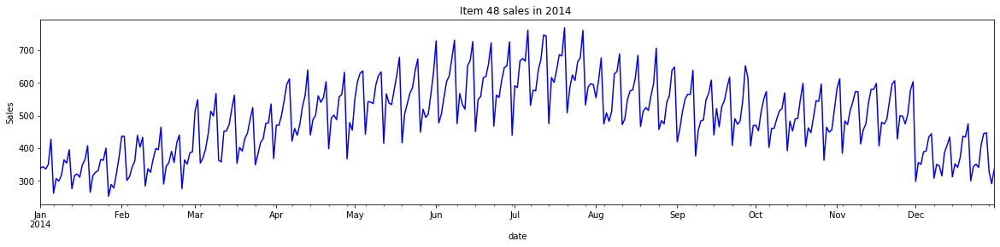

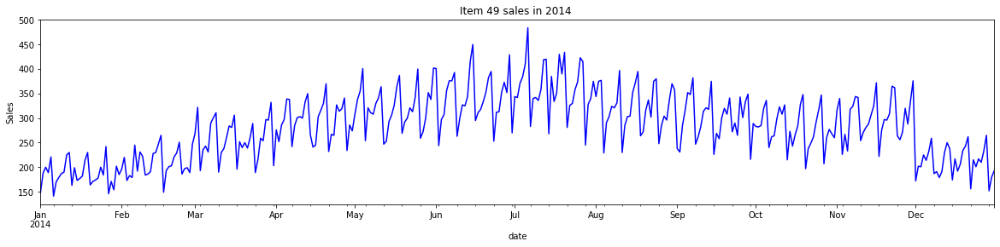

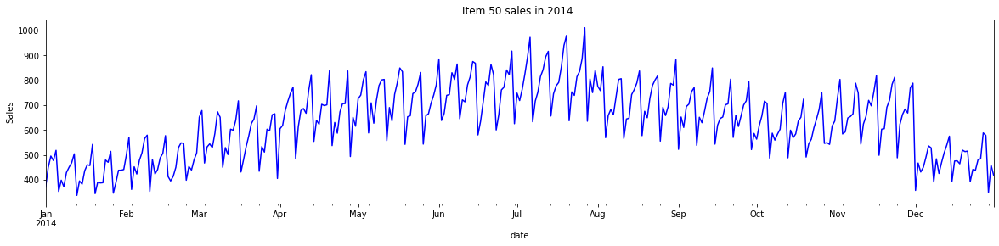

In [42]:
for i in df_train['item'].unique():
    item1_2014= df_train1.loc[(df_train['item'] == i) & (df_train1['year']==2014)]
    item1_2014 = item1_2014.groupby(['date','item'])['sales'].sum().reset_index()
    item1_2014 = item1_2014.set_index('date')
    item1_d_2014 = item1_2014['sales'].resample('D').mean()
    item1_d_2014.plot(figsize=(20,4),color='blue')
    plt.title(f"Item {i} sales in 2014 ")
    plt.ylabel("Sales")
    plt.show()

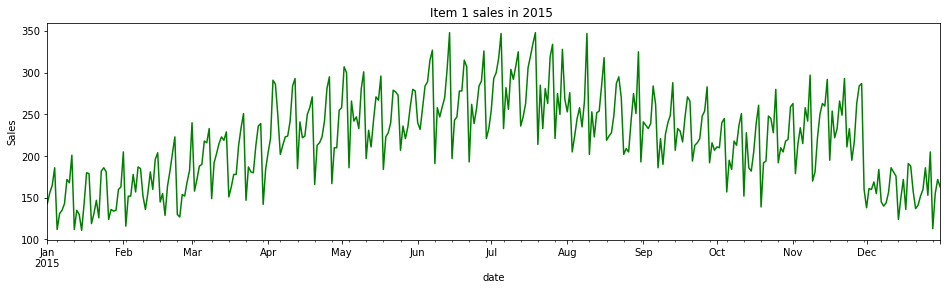

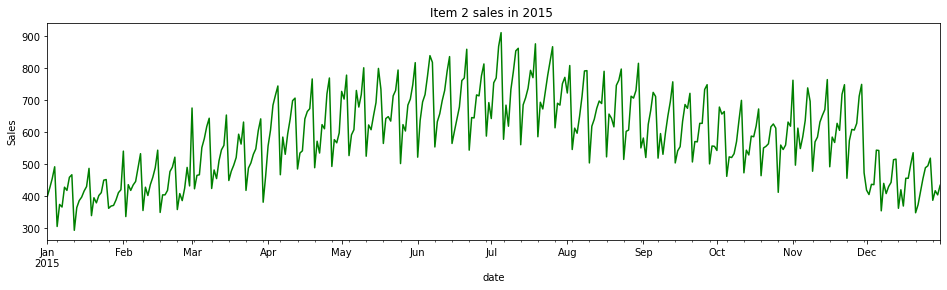

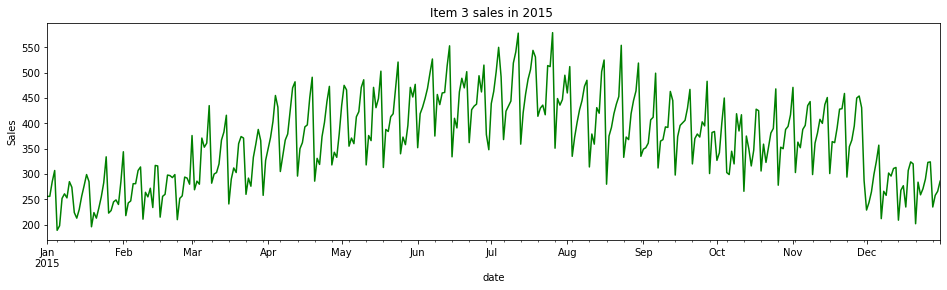

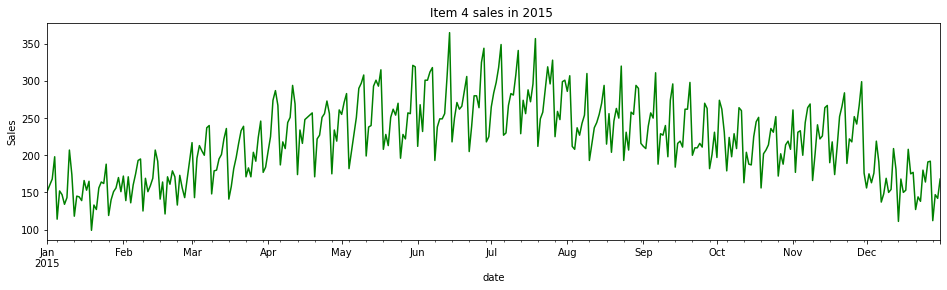

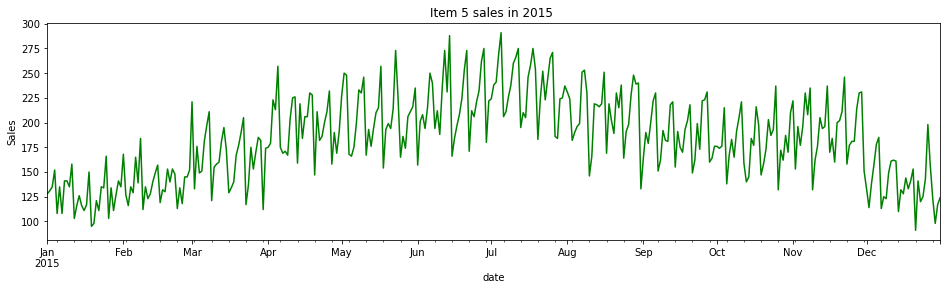

...

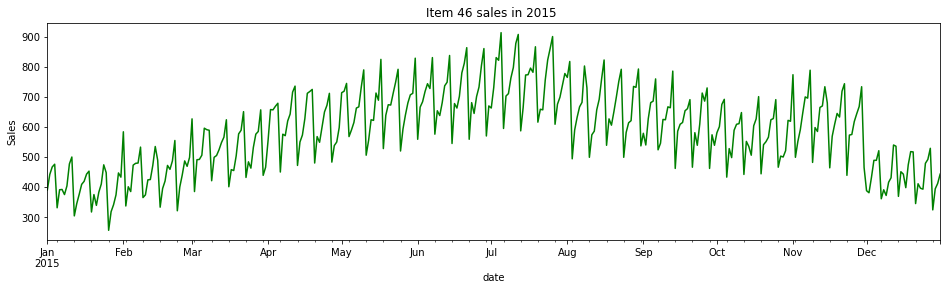

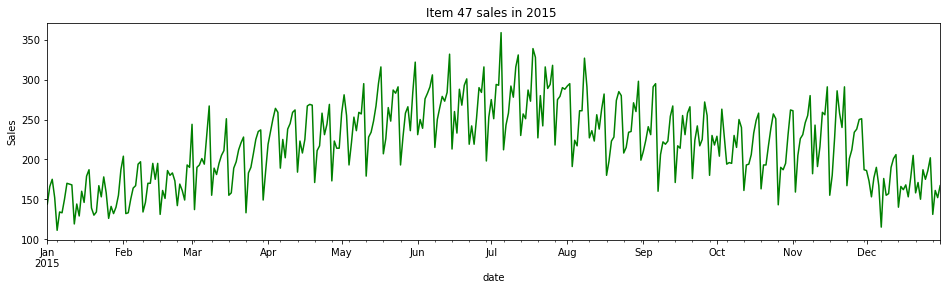

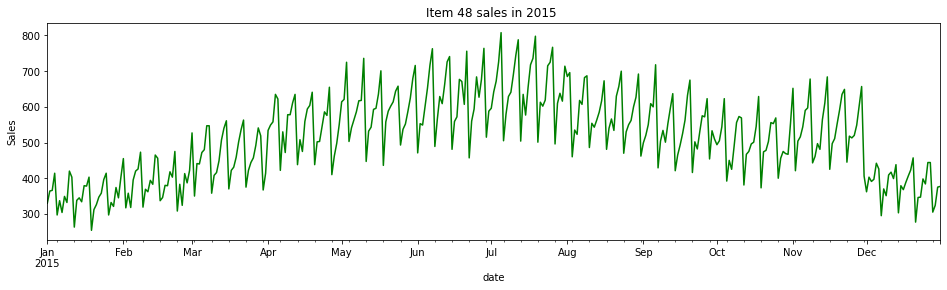

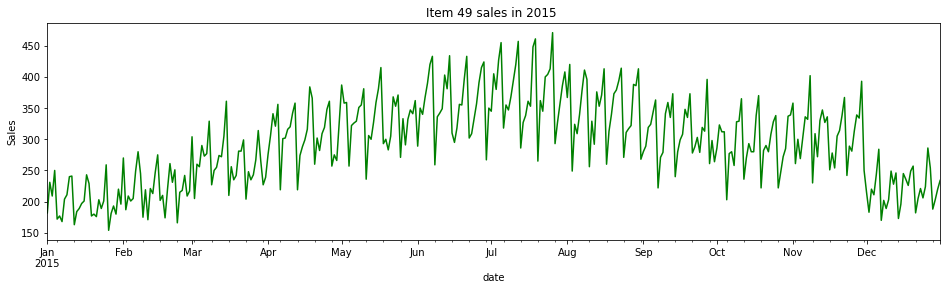

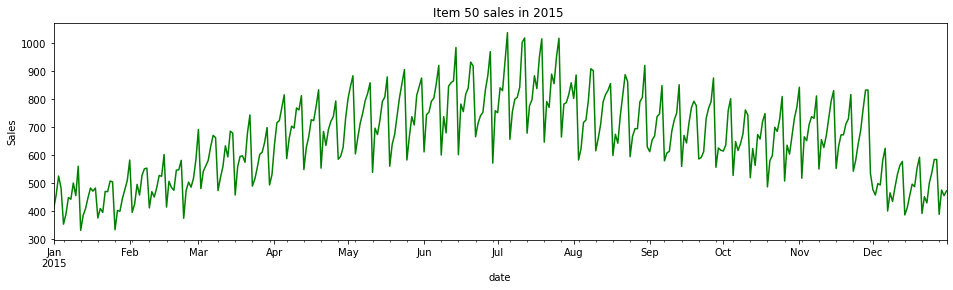

In [43]:
for i in df_train['item'].unique():
    item1_2015= df_train1.loc[(df_train['item'] == i) & (df_train1['year']==2015)]
    item1_2015 = item1_2015.groupby(['date','item'])['sales'].sum().reset_index()
    item1_2015 = item1_2015.set_index('date')
    item1_d_2015 = item1_2015['sales'].resample('D').mean()
    item1_d_2015.plot(figsize=(16,4),color='green')
    plt.title(f"Item {i} sales in 2015 ")
    plt.ylabel("Sales")
    plt.show()

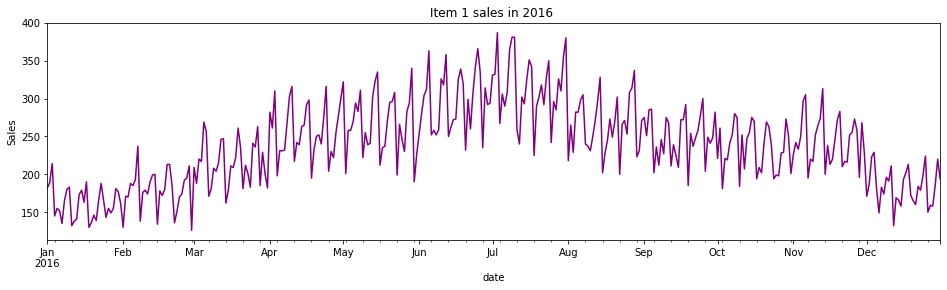

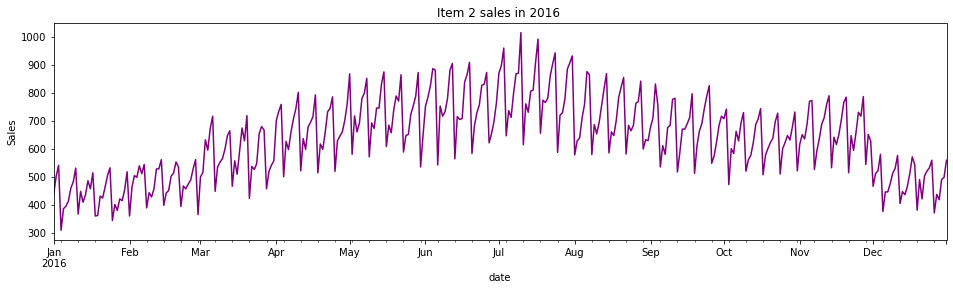

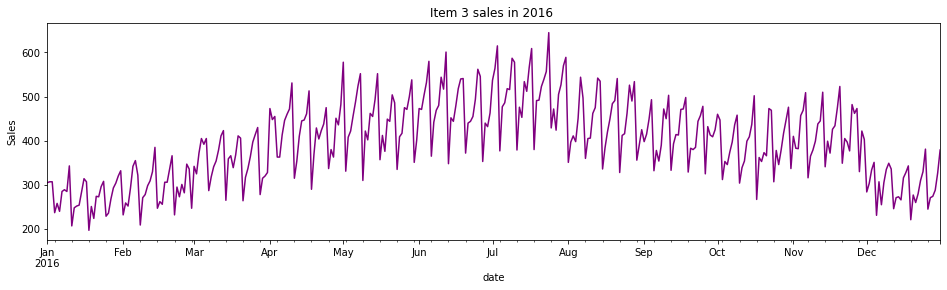

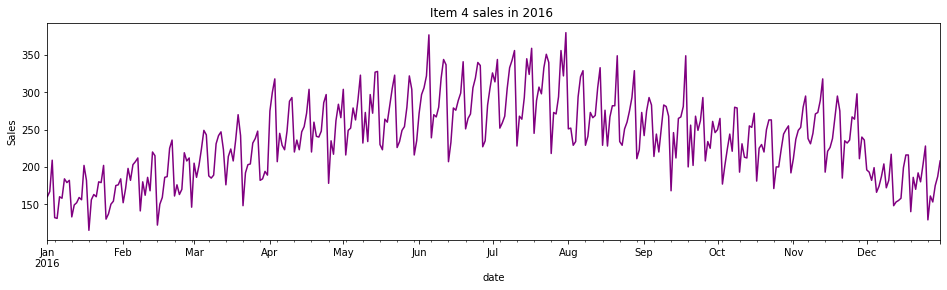

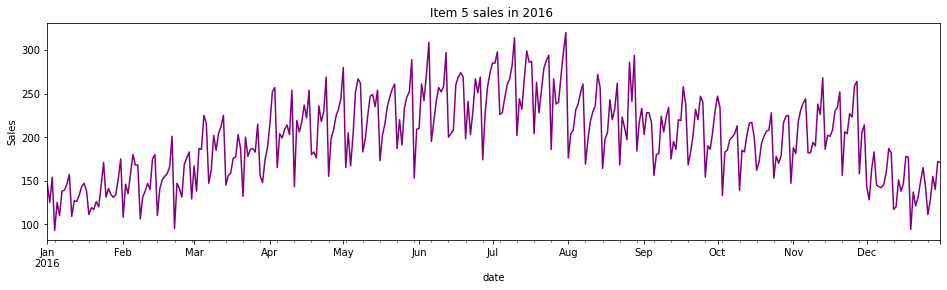

...

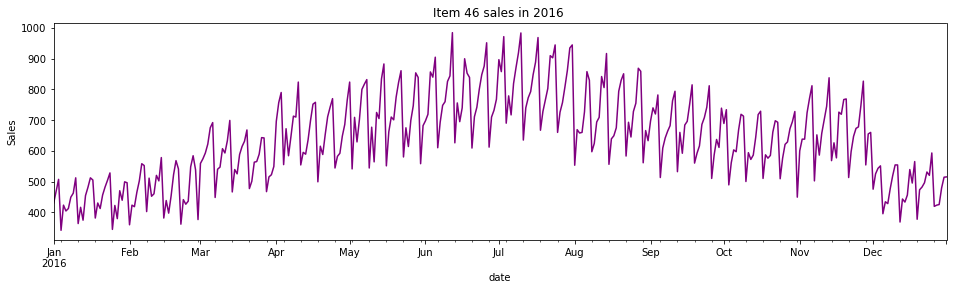

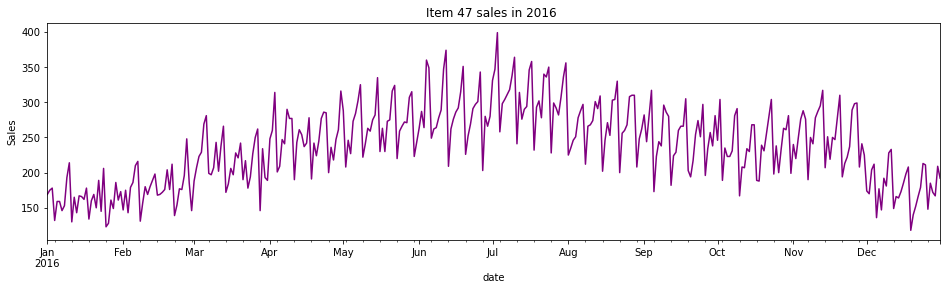

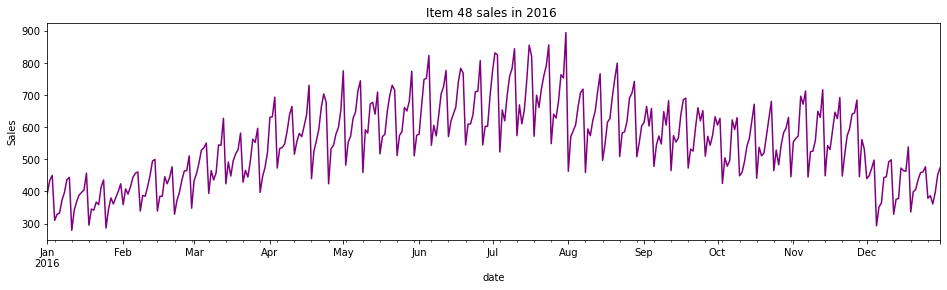

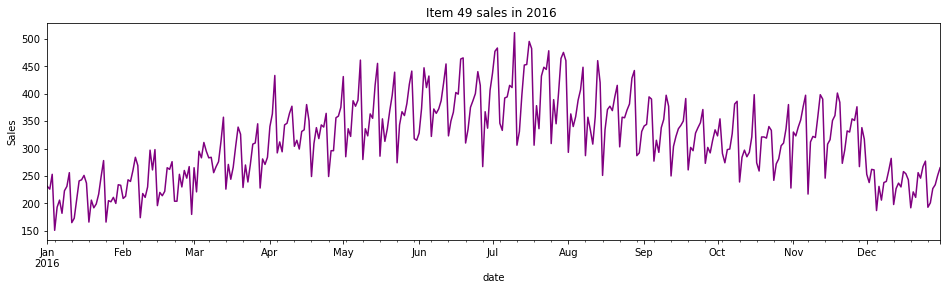

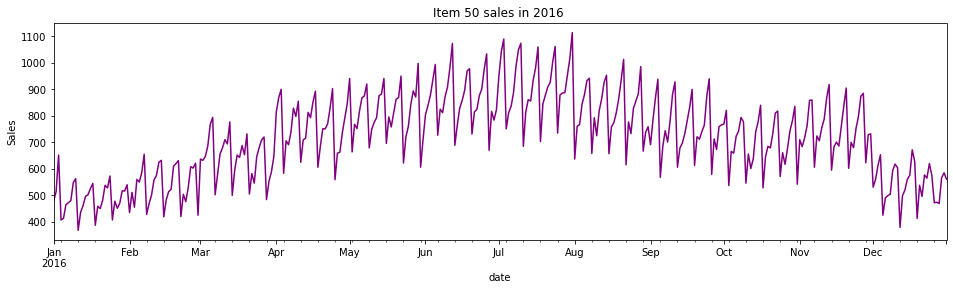

In [44]:
for i in df_train['item'].unique():
    item1_2016= df_train1.loc[(df_train['item'] == i) & (df_train1['year']==2016)]
    item1_2016 = item1_2016.groupby(['date','item'])['sales'].sum().reset_index()
    item1_2016 = item1_2016.set_index('date')
    item1_d_2016 = item1_2016['sales'].resample('D').mean()
    item1_d_2016.plot(figsize=(16,4),color='purple')
    plt.title(f"Item {i} sales in 2016 ")
    plt.ylabel("Sales")
    plt.show()

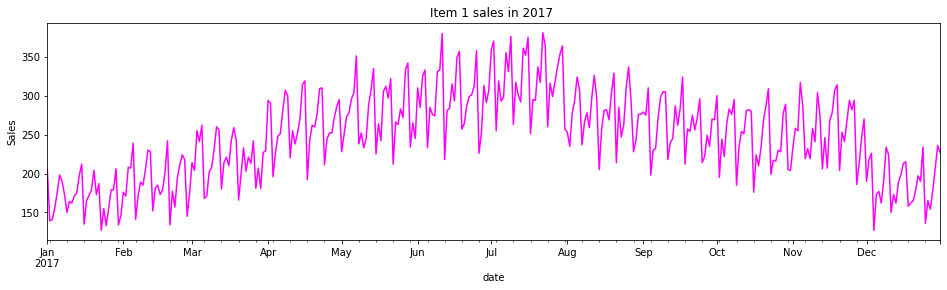

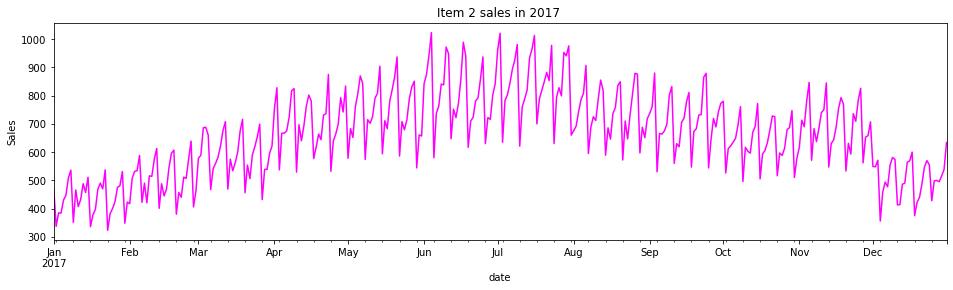

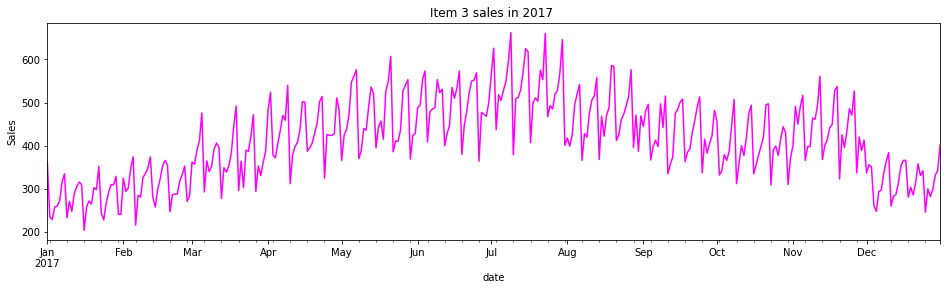

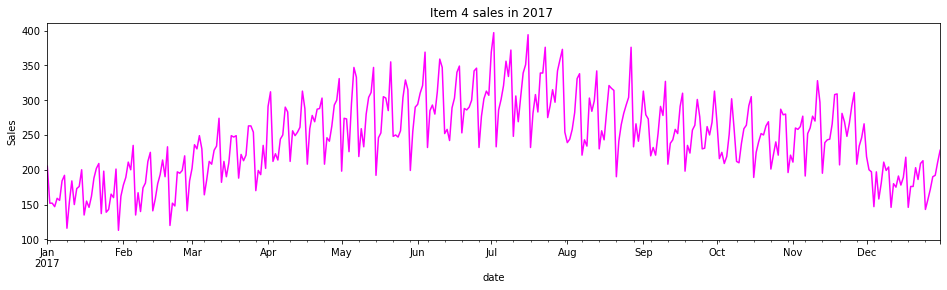

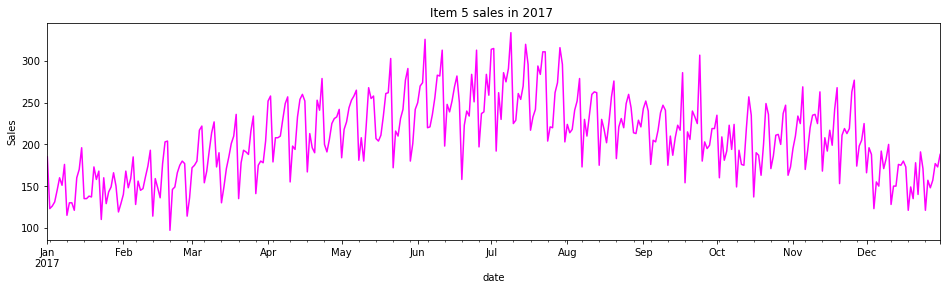

...

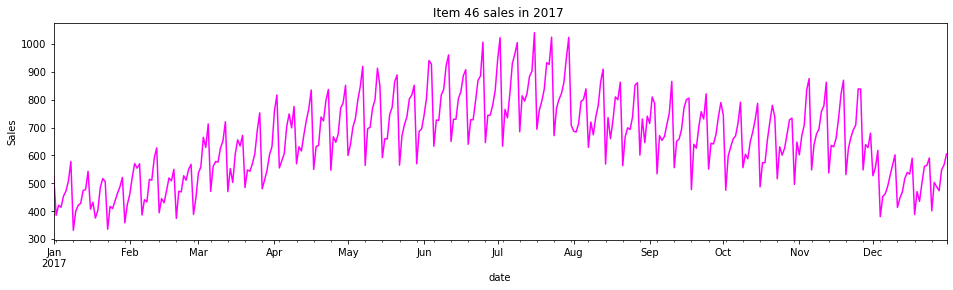

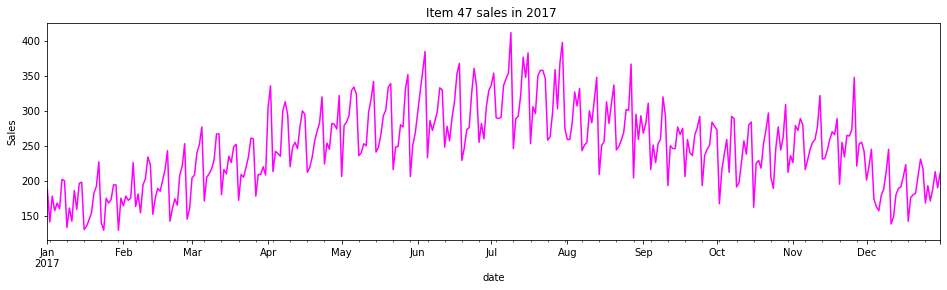

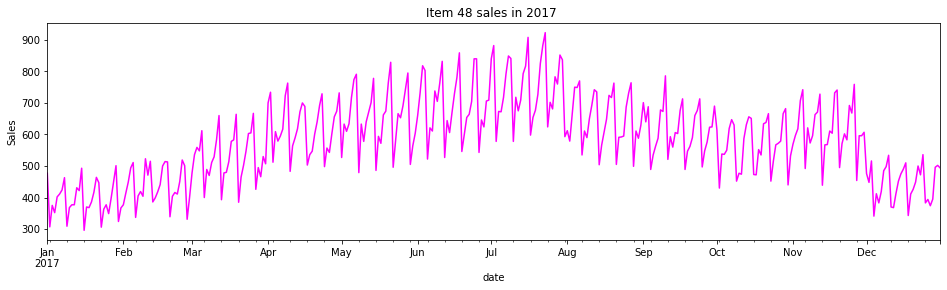

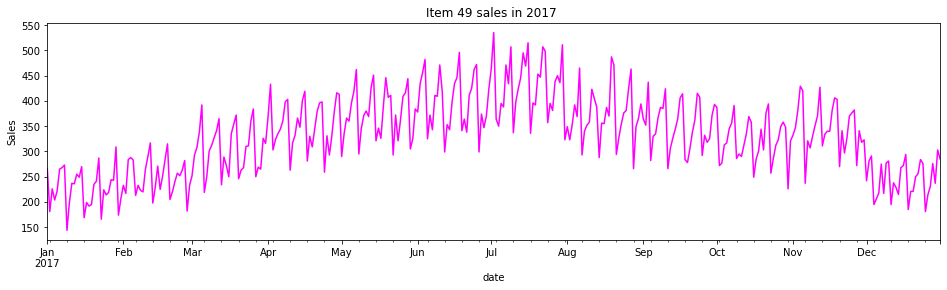

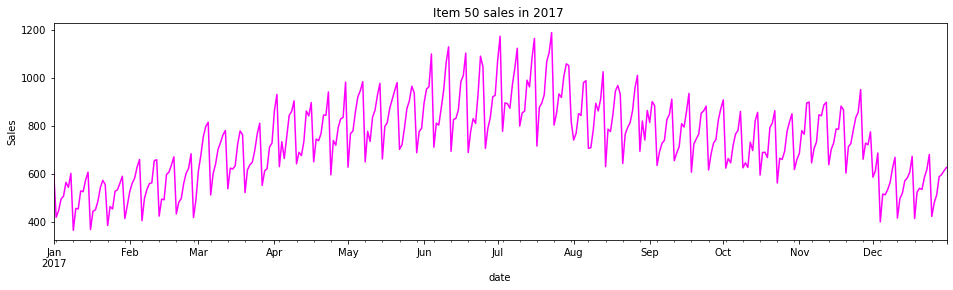

In [45]:
for i in df_train['item'].unique():
    item1_2017= df_train1.loc[(df_train['item'] == i) & (df_train1['year']==2017)]
    item1_2017 = item1_2017.groupby(['date','item'])['sales'].sum().reset_index()
    item1_2017 = item1_2017.set_index('date')
    item1_d_2017 = item1_2017['sales'].resample('D').mean()
    item1_d_2017.plot(figsize=(16,4),color='magenta')
    plt.title(f"Item {i} sales in 2017 ")
    plt.ylabel("Sales")
    plt.show()

# Analysis of Monthly trend and seasonality

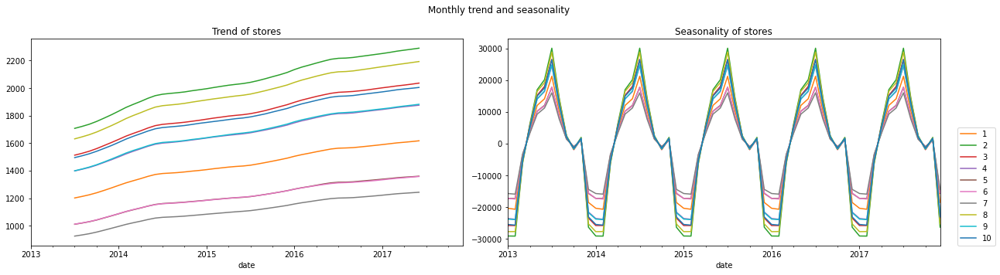

In [46]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 5))

# plot the monthly trend for each store in the first subplot
ax1.set_title('Trend of stores')
for i in df_train['store'].unique():
    store_i = df_train.loc[df_train['store'] == i]
    store_i = store_i.groupby('date')['sales'].mean().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i, model='additive')
    decomposition_store_i.trend.plot(ax=ax1, color=f'C{i}')

# plot the monthly seasonality for each store in the second subplot
ax2.set_title('Seasonality of stores')
for i in df_train['store'].unique():
    store_i = df_train.loc[df_train['store'] == i]
    store_i = store_i.groupby('date')['sales'].sum().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i, model='additive')
    decomposition_store_i.seasonal.plot(ax=ax2, color=f'C{i}')

# add legend to the second subplot
ax2.legend(df_train['store'].unique(), loc=(1.04, 0))

# set the overall title of the figure
fig.suptitle("Monthly trend and seasonality")

# adjust the layout of the subplots
plt.tight_layout()

# ETS (Error, Trend, Seasonality) decomposition

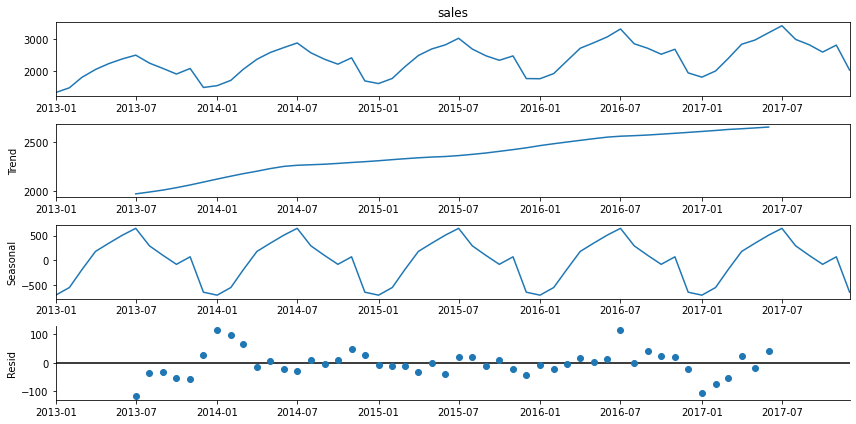

In [47]:
# set the figure size
rcParams['figure.figsize'] = (12, 6)

# perform seasonal decomposition and plot the results
decomposition_store1 = sm.tsa.seasonal_decompose(store1_m, model='additive')
fig = decomposition_store1.plot()
fig.set_size_inches(12, 6)
fig.gca().spines['top'].set_visible(False)
fig.gca().spines['right'].set_visible(False)


# Trend and Seasonality analysis of all stores

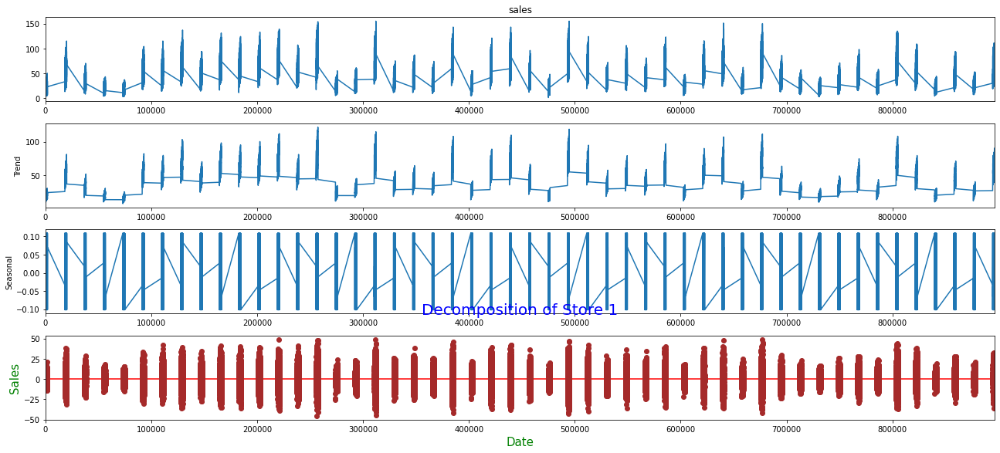

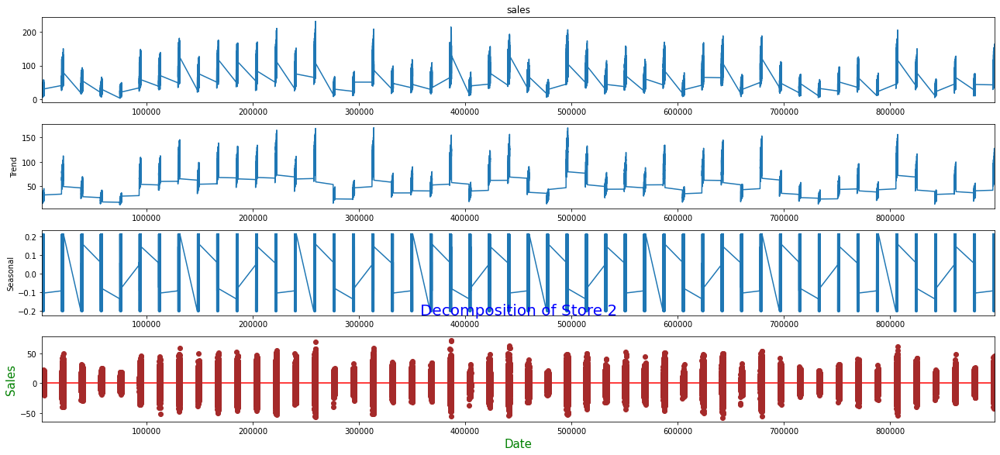

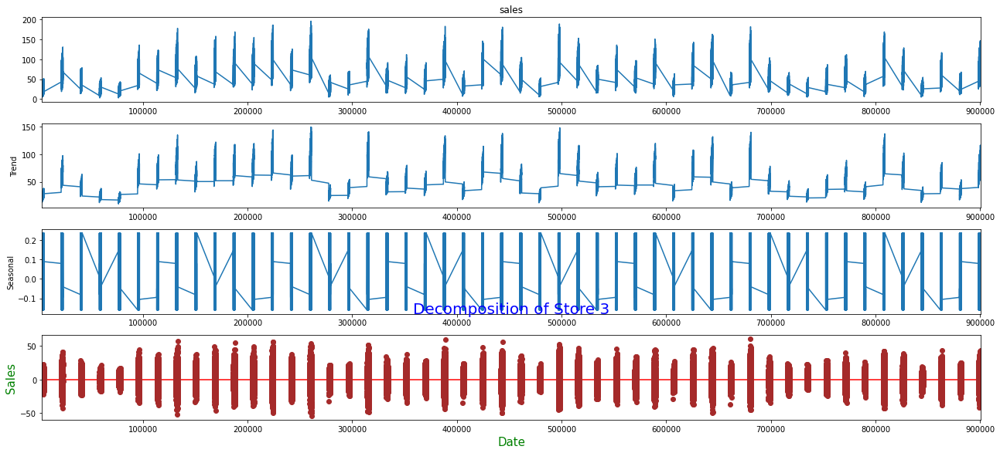

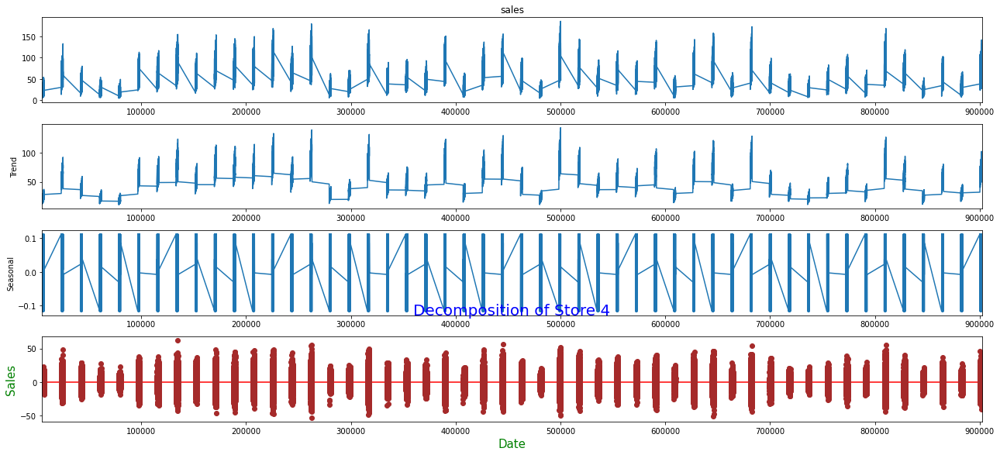

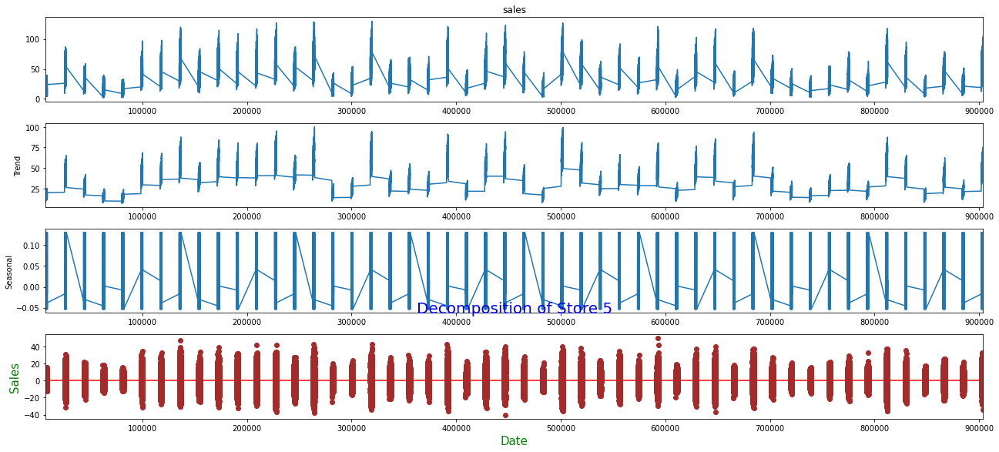

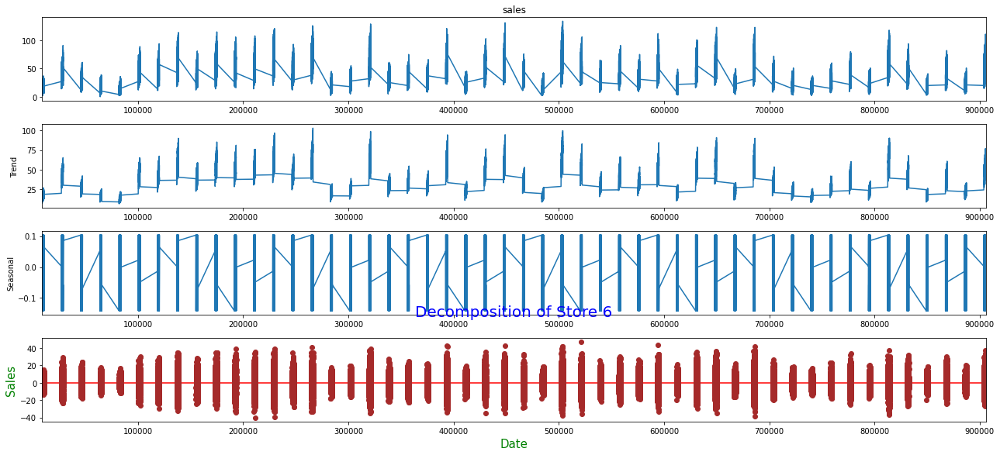

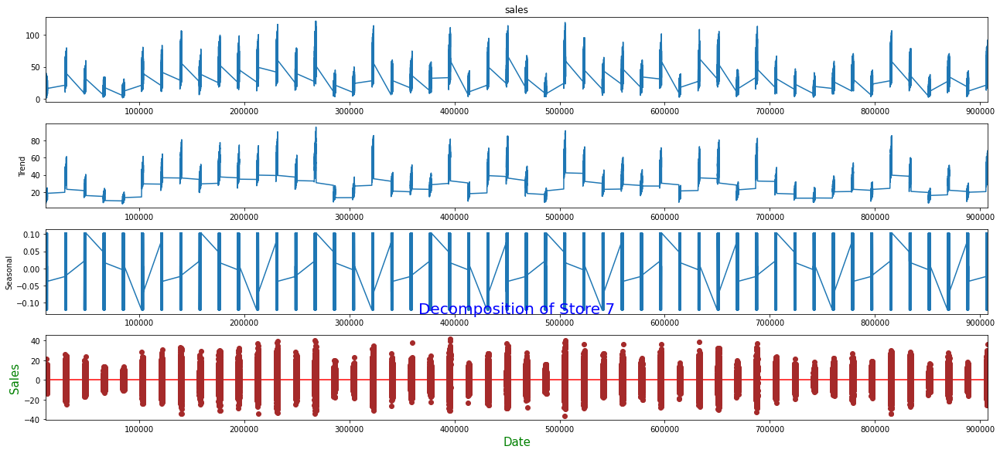

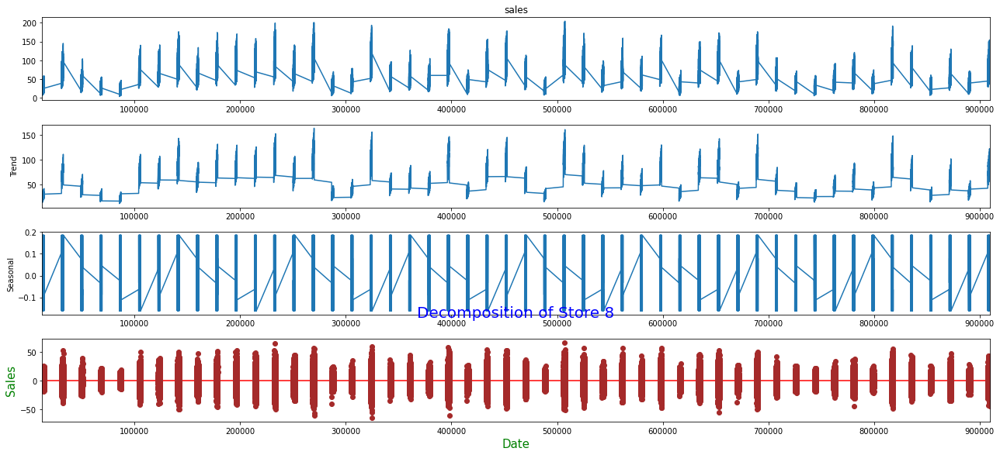

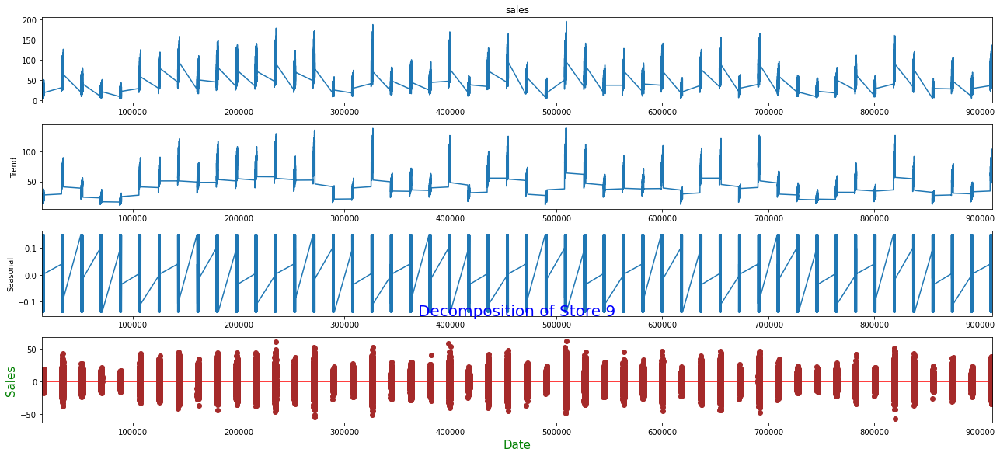

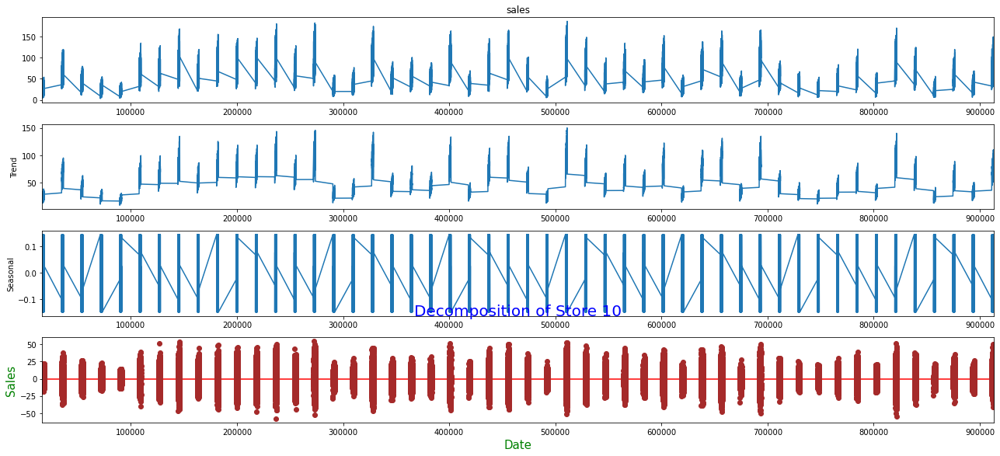

In [48]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8

for i in df_train['store'].unique():
    store_i = df_train.loc[df_train['store'] == i]
    decomposed_ts = seasonal_decompose(store_i.sales, model='additive', period=12)
    fig = decomposed_ts.plot()
    plt.gca().lines[0].set_color('brown')
    plt.gca().lines[1].set_color('red')
    plt.title('\n'+'Decomposition of Store ' + str(i) + '\n', fontsize=20, color='blue')
    plt.xlabel('Date', fontsize=15, color='green')
    plt.ylabel('Sales', fontsize=15, color='green')
    plt.show()

# Augmented Dickey-Fuller Test for testing Seasonality

In [49]:

# display the ADF report with a custom color scheme
def adf_test(series, title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    result = adfuller(series.dropna(), autolag='AIC')  # .dropna() handles differenced data

    labels = ['ADF test statistic', 'p-value', '# lags used', '# observations']
    out = pd.Series(result[0:4], index=labels)

    for key, val in result[4].items():
        out[f'critical value ({key})'] = val

    # customize the output style
    print(f'\n\033[1mAugmented Dickey-Fuller Test: {title}\033[0m')
    print(out.to_string(), '\n', '-' * 70, sep='')
    if result[1] <= 0.05:
        print("\033[92mStrong evidence against the null hypothesis\033[0m")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("\033[91mWeak evidence against the null hypothesis\033[0m")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

In [50]:
adf_test(store1_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.165600
p-value                  0.000010
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [51]:
adf_test(store2_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.165600
p-value                  0.000010
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [52]:
adf_test(store3_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.209288
p-value                  0.000008
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [53]:
adf_test(store4_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.511807
p-value                  0.000002
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [54]:
adf_test(store5_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.148333
p-value                  0.000011
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [55]:
adf_test(store6_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.501111
p-value                  0.000002
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [56]:
adf_test(store7_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.576794
p-value                  0.000001
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [57]:
adf_test(store8_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.323105
p-value                  0.000005
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [58]:
adf_test(store9_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.528050
p-value                  0.000002
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [59]:
adf_test(store10_m)


Augmented Dickey-Fuller Test: 
ADF test statistic      -5.275954
p-value                  0.000006
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
----------------------------------------------------------------------
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Found that monthly sales of all the stores are stationary

 Monthly Sales

In [60]:
# convert the 'date' column to datetime format
df_train['date'] = pd.to_datetime(df_train['date'])

# group the data by month and sum the sales
monthly_sales = df_train.groupby(pd.Grouper(key='date', freq='M'))['sales'].sum()

# print the resulting monthly sales
monthly_sales=pd.DataFrame(monthly_sales,columns=["sales"])
print(monthly_sales)
type(monthly_sales)


              sales
date               
2013-01-31   454904
2013-02-28   459417
2013-03-31   617382
2013-04-30   682274
2013-05-31   763242
2013-06-30   795597
2013-07-31   855922
2013-08-31   766761
2013-09-30   689907
2013-10-31   656587
2013-11-30   692643
2013-12-31   506607
2014-01-31   525987
2014-02-28   529117
2014-03-31   704301
2014-04-30   788914
2014-05-31   882877
2014-06-30   906842
2014-07-31   989010
2014-08-31   885596
2014-09-30   785124
2014-10-31   758883
2014-11-30   800783
2014-12-31   578048
2015-01-31   552513
2015-02-28   551317
2015-03-31   730951
2015-04-30   824467
2015-05-31   926902
2015-06-30   937184
2015-07-31  1037350
2015-08-31   920401
2015-09-30   823332
2015-10-31   797253
2015-11-30   827645
2015-12-31   607572
2016-01-31   602439
2016-02-29   614957
2016-03-31   790881
2016-04-30   901950
2016-05-31   988730
2016-06-30  1022664
2016-07-31  1138718
2016-08-31   981494
2016-09-30   896831
2016-10-31   863637
2016-11-30   891448
2016-12-31   663411


pandas.core.frame.DataFrame

In [61]:
#5 years overall
average_m_sales = monthly_sales.sales.mean()
print(f"Overall Average Monthly Sales: ${average_m_sales}")

def avarage_12months():
# Last 1 years (this will be the forecasted sales):
    average_m_sales_1y = monthly_sales.sales[-12:].mean()
    print(f"Last 12 months average monthly sales: ${average_m_sales_1y}")
avarage_12months()

Overall Average Monthly Sales: $795075.2
Last 12 months average monthly sales: $894478.3333333334


# Finding Time Series Stationarity

In [62]:
import pandas as pd

def monthlyORyears_sales(data, time=['monthly', 'years']):
    data = data.copy()
    if 'monthly' in time:
        # Check if date has day indicator before dropping it
        if len(str(data.date.iloc[0])) > 7:
            data.date = data.date.apply(lambda x: str(x)[:-3])
    else:
        data.date = data.date.apply(lambda x: str(x)[:4])
        
    # Sum sales per month: 
    data = data.groupby('date')['sales'].sum().reset_index()
    data.date = pd.to_datetime(data.date)
        
    return data


In [63]:
m_df = monthlyORyears_sales(df_train,"monthly")

m_df.to_csv('./monthly_data.csv')

In [64]:
m_df.head(10)

,date,sales
0,2013-01-01,13696
1,2013-01-02,13678
2,2013-01-03,14488
3,2013-01-04,15677
4,2013-01-05,16237
5,2013-01-06,17291
6,2013-01-07,11769
7,2013-01-08,13560
8,2013-01-09,13878
9,2013-01-10,14642


In [65]:
year_df = monthlyORyears_sales(df_train,"years")
year_df

,date,sales
0,2013-01-01,7941243
1,2014-01-01,9135482
2,2015-01-01,9536887
3,2016-01-01,10357160
4,2017-01-01,10733740


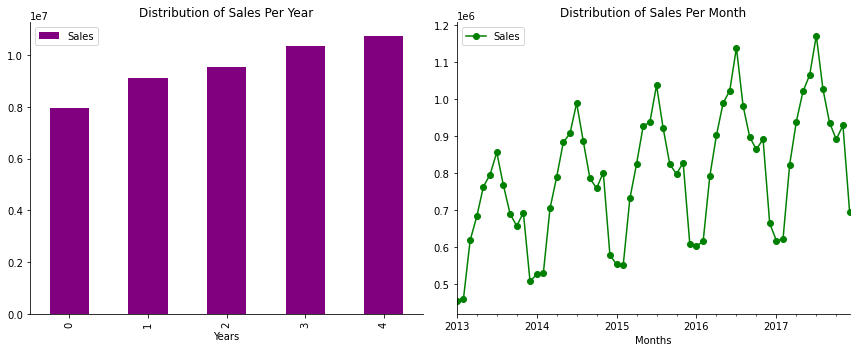

In [66]:
# Set up the layout of the figure
layout = (1, 2)

# Create the two subplots in the grid layout
raw = plt.subplot2grid(layout, (0 ,0))
law = plt.subplot2grid(layout, (0 ,1))

# Plot the distribution of sales per year in the first subplot
year_df['sales'].plot(kind='bar', color='purple', label='Sales', ax=raw, figsize=(12, 5))
raw.set(xlabel='Years', title='Distribution of Sales Per Year')

# Plot the distribution of sales per month in the second subplot
monthly_sales['sales'].plot(marker='o', color='green', label='Sales', ax=law)
law.set(xlabel='Months', title='Distribution of Sales Per Month')

# Customize the figure
sns.despine()
plt.tight_layout()

# Add legends and show the figure
raw.legend()
law.legend()
plt.show()

In [67]:
monthly_sales=monthly_sales.reset_index()

In [68]:
print('date' in monthly_sales.columns)


True


In [69]:
def time_plot(data, x_col, y_col, title):
    fig, ax = plt.subplots(figsize = (15,8))
    sns.lineplot(x_col, y_col, data = data, ax = ax, color = 'green', label='Total Sales')
    
    s_mean = data.groupby(data.date.dt.year)[y_col].mean().reset_index()
    s_mean.date = pd.to_datetime(s_mean.date, format='%Y')
    sns.lineplot((s_mean.date + datetime.timedelta(6*365/12)), y_col, data=s_mean, ax=ax, color='red', label='Mean Sales')   
    
    ax.set(xlabel = "Years",
           ylabel = "Sales",
           title = title)

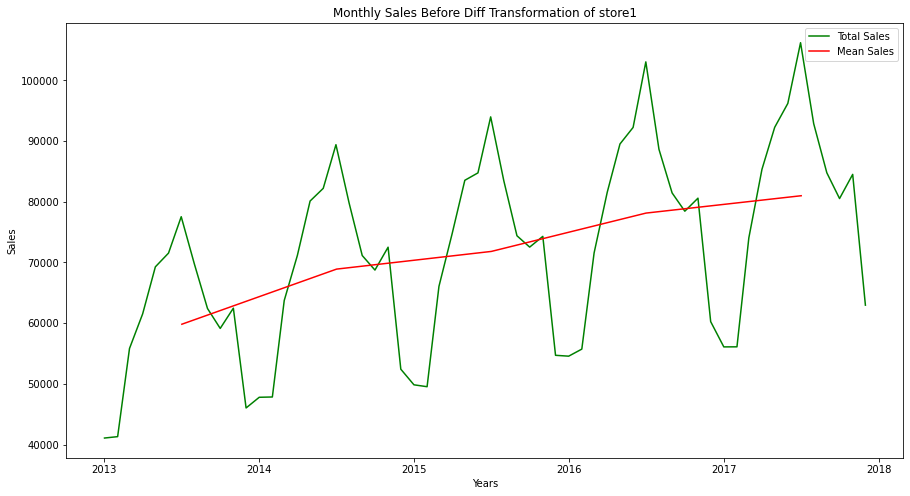

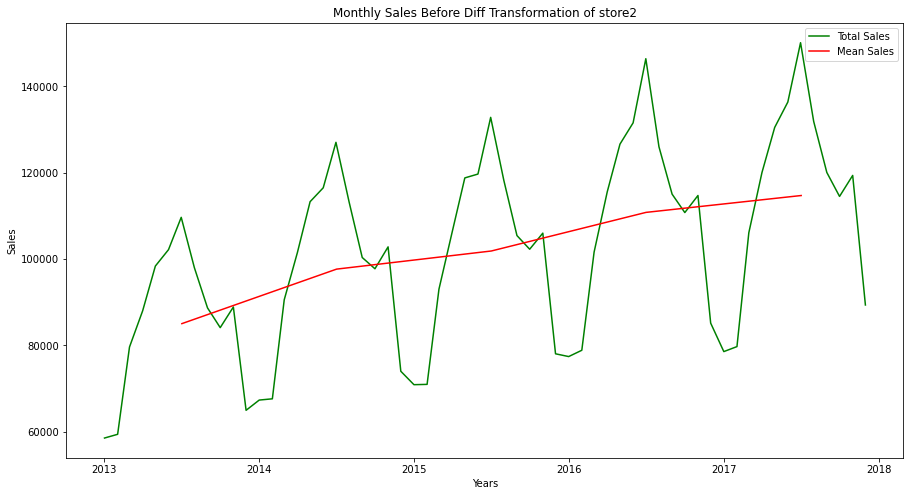

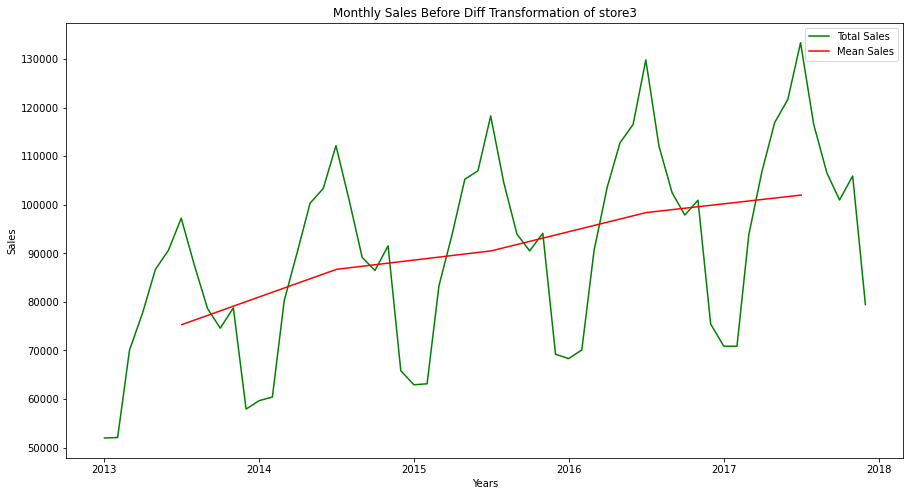

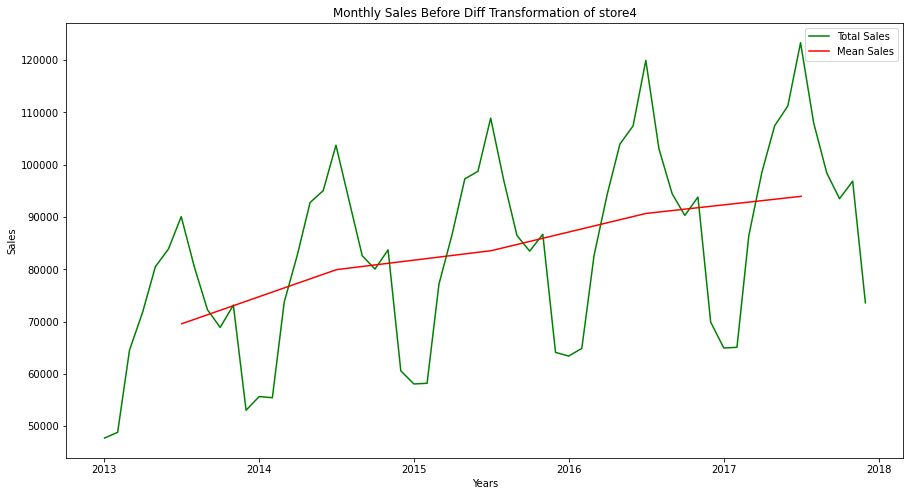

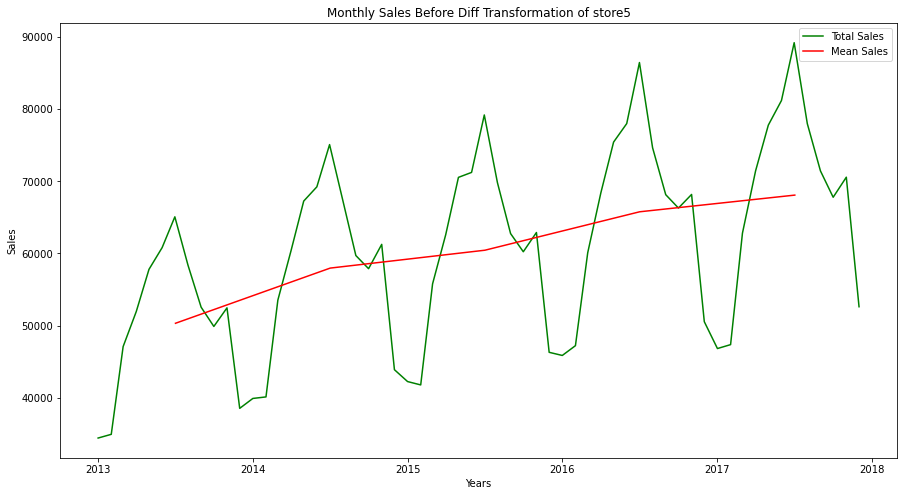

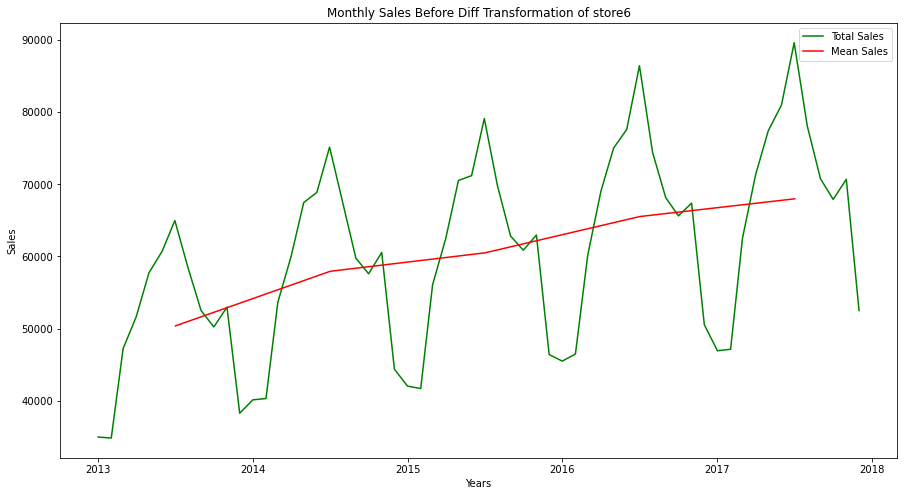

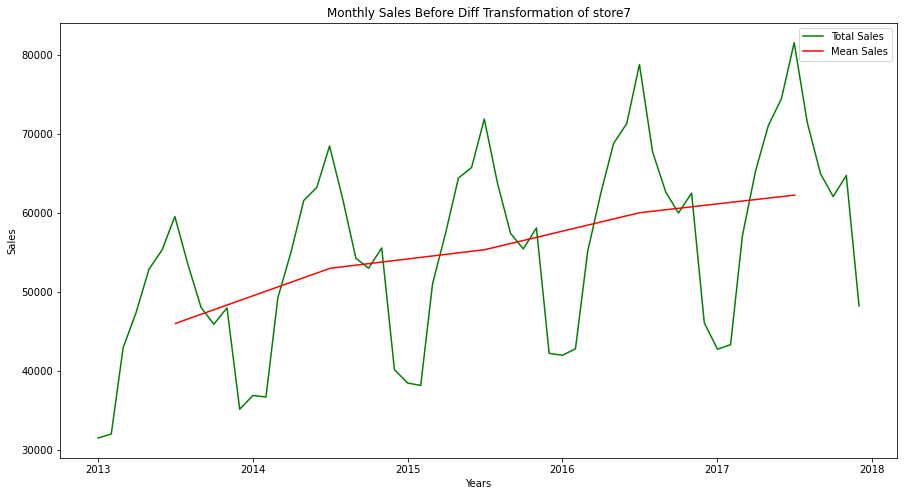

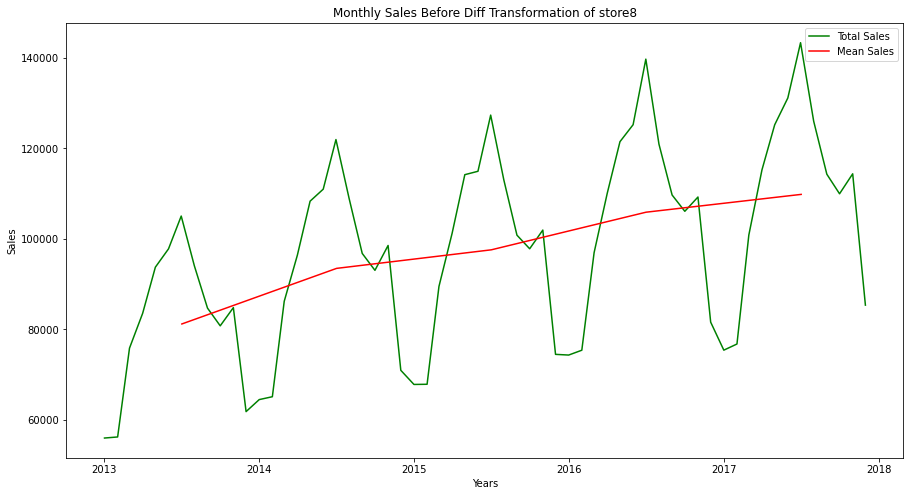

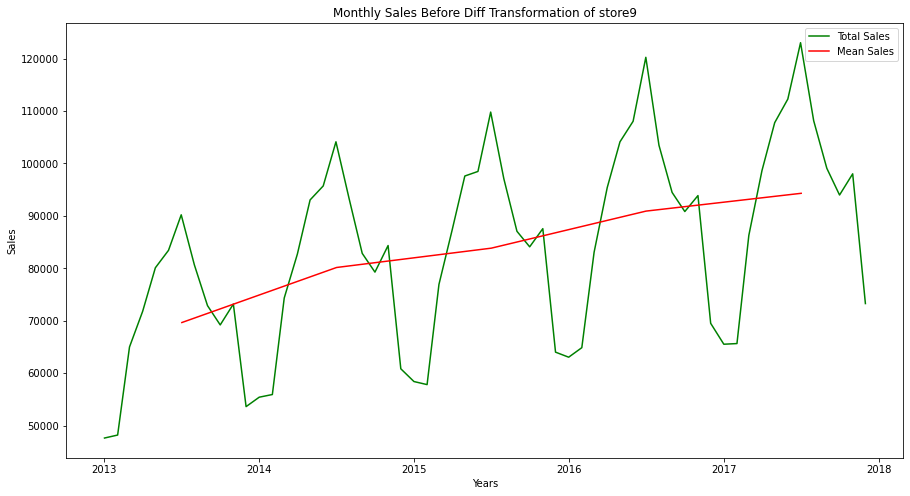

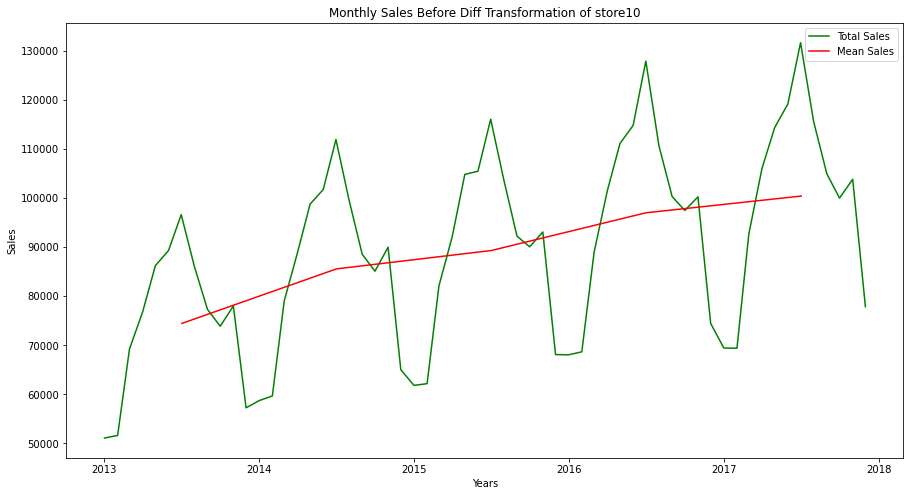

In [70]:
for i in df_train['store'].unique():
    store_i = df_train.loc[df_train['store'] == i]
    store_i=store_i.groupby('date')['sales'].sum().reset_index()
    store_i=store_i.set_index('date')
    store_i=store_i.sales.resample('MS').sum()
    store_i=store_i.reset_index()
    time_plot(store_i, 'date', 'sales', 'Monthly Sales Before Diff Transformation of store'+ str(i) )
#time_plot(monthly_sales, 'date', 'sales', 'Monthly Sales Before Diff Transformation' )

From the graphs it is clear that each month's sales in every store is following an upward trend even if we the sales per month is stationary

# Differentiation

In [71]:
def get_diff(data):
    """Calculate the difference in sales month over month:"""
    
    data['sales_diff'] = data.sales.diff()
    data = data.dropna()
    
    data.to_csv('./stationary_df.csv')
    
    return data


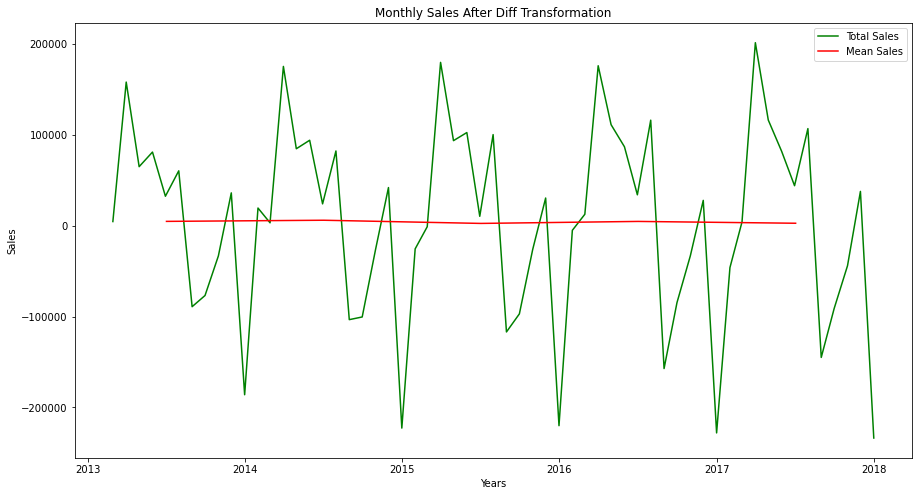

In [72]:
stationary_df = get_diff(monthly_sales)
time_plot(stationary_df, 'date', 'sales_diff','Monthly Sales After Diff Transformation')
plt.show()

In [73]:
monthly_sales.columns

Index(['date', 'sales', 'sales_diff'], dtype='object')

Differencing is a method used to eliminate the trend or varying mean in a time series data by calculating the differences between consecutive terms in the series.After differencing, our monthly sales data now became stationary and ready to model





In [74]:
#stationary_df=stationary_df.drop(["index"],axis=1)
stationary_df

,date,sales,sales_diff
1,2013-02-28,459417,4513.0
2,2013-03-31,617382,157965.0
3,2013-04-30,682274,64892.0
4,2013-05-31,763242,80968.0
5,2013-06-30,795597,32355.0
6,2013-07-31,855922,60325.0
7,2013-08-31,766761,-89161.0
8,2013-09-30,689907,-76854.0
9,2013-10-31,656587,-33320.0
10,2013-11-30,692643,36056.0


# ARIMA MODEL BUILDING PRE REQUISITES

For building Arima model, we will need only a datetime index and the dependent variable (diff in sales) columns.

In [75]:
def build_arima_data(data):
#Generates a csv-file with a datetime index and a dependent sales column for ARIMA modeling."""
    
    da_data = data.set_index('date').drop('sales', axis=1)
    da_data.dropna(axis=0)
    
    da_data.to_csv('./arima_df.csv')
    
    return da_data

In [76]:
datatime_df = build_arima_data(stationary_df)
datatime_df # ARIMA Dataframe

,sales_diff
date,
2013-02-28,4513.0
2013-03-31,157965.0
2013-04-30,64892.0
2013-05-31,80968.0
2013-06-30,32355.0
2013-07-31,60325.0
2013-08-31,-89161.0
2013-09-30,-76854.0
2013-10-31,-33320.0


# Finding Autocorrelation and Partial autocorrelation plots 

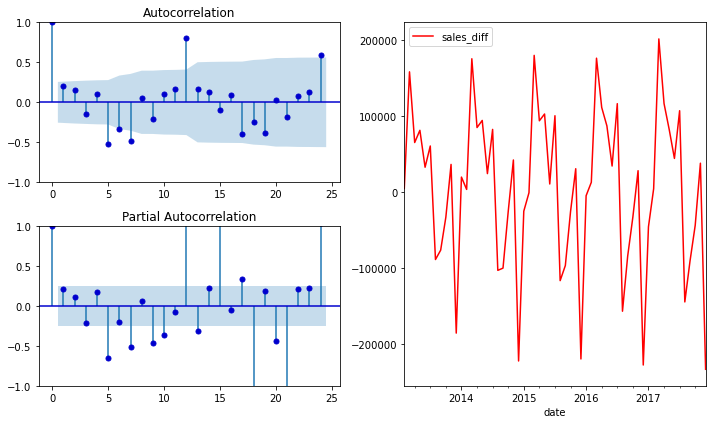

In [77]:
def plots_lag(data, lags=None):
    """Convert dataframe to datetime index"""
    dt_data = data.set_index('date').drop('sales', axis=1)
    dt_data.dropna(axis=0)
    
    
    law  = plt.subplot(122)
    acf  = plt.subplot(221)
    pacf = plt.subplot(223)
    
    dt_data.plot(ax=law, figsize=(10,6), color='red')
    # Plot the autocorrelation function:
    smt.graphics.plot_acf(dt_data, lags=lags, ax=acf, color='mediumblue')
    smt.graphics.plot_pacf(dt_data, lags=lags, ax=pacf, color='mediumblue')
    
    # Will also adjust spacing between subplots to minimize the overlaps:
    plt.tight_layout()

plots_lag(stationary_df, lags=24);
    
    

Taking into account the information provided, we will opt for a 12-month look-back period. As a result, we will create a data frame comprising 13 columns, with one column dedicated to each of the 12 months, and another column dedicated to the dependent variable, which is the difference in sales.

In [78]:
len(stationary_df)

59

In [79]:
stationary_df

,date,sales,sales_diff
1,2013-02-28,459417,4513.0
2,2013-03-31,617382,157965.0
3,2013-04-30,682274,64892.0
4,2013-05-31,763242,80968.0
5,2013-06-30,795597,32355.0
6,2013-07-31,855922,60325.0
7,2013-08-31,766761,-89161.0
8,2013-09-30,689907,-76854.0
9,2013-10-31,656587,-33320.0
10,2013-11-30,692643,36056.0


In [80]:
len(store1_m)

60

In [143]:
store1_m

date
2013-01-01    1325.064516
2013-02-01    1475.214286
2013-03-01    1800.870968
2013-04-01    2050.766667
2013-05-01    2234.580645
2013-06-01    2384.366667
2013-07-01    2500.870968
2013-08-01    2249.838710
2013-09-01    2080.266667
2013-10-01    1907.419355
2013-11-01    2082.166667
2013-12-01    1484.806452
2014-01-01    1541.548387
2014-02-01    1708.500000
2014-03-01    2055.774194
2014-04-01    2371.633333
2014-05-01    2584.129032
2014-06-01    2739.866667
2014-07-01    2883.516129
2014-08-01    2574.000000
2014-09-01    2371.133333
2014-10-01    2217.419355
2014-11-01    2416.866667
2014-12-01    1690.806452
2015-01-01    1607.806452
2015-02-01    1768.928571
2015-03-01    2130.838710
2015-04-01    2490.033333
2015-05-01    2694.290323
2015-06-01    2824.833333
2015-07-01    3031.258065
2015-08-01    2691.677419
2015-09-01    2479.633333
2015-10-01    2339.354839
2015-11-01    2476.400000
2015-12-01    1764.548387
2016-01-01    1759.967742
2016-02-01    1921.448276
2016-03

In [81]:
model_data=stationary_df.set_index("date").drop("sales",axis=1)

In [82]:
model_data

,sales_diff
date,
2013-02-28,4513.0
2013-03-31,157965.0
2013-04-30,64892.0
2013-05-31,80968.0
2013-06-30,32355.0
2013-07-31,60325.0
2013-08-31,-89161.0
2013-09-30,-76854.0
2013-10-31,-33320.0


In [83]:
store1_train=model_data.iloc[:47]
store1_test=model_data.iloc[47:]

In [84]:
store1_test

,sales_diff
date,
2017-01-31,-46105.0
2017-02-28,4063.0
2017-03-31,201298.0
2017-04-30,116195.0
2017-05-31,81824.0
2017-06-30,43938.0
2017-07-31,106769.0
2017-08-31,-144990.0
2017-09-30,-91140.0


In [85]:
len(store1_test)

12

# ARIMA Modeling


In [86]:
from pmdarima import auto_arima

# Store 1 Model building

In [87]:
store1_model=auto_arima(model_data,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.66 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1052.972, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1049.825, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=1050.188, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1051.127, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1054.981, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1051.396, Time=0.45 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=1050.614, Time=0.38 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=1050.358, Time=0.24 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=1052.446, Time=1.04 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=1048.044, Time=0.12 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1049.633, Time=0.68 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=1049.149, Time=0.62 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=1048.532, Time=0.14 sec
 ARIMA(0,0,0)(2,1,1)[12]

The following code establishes our model and generates dynamic forecasts for the most recent 12 months of data. When making standard predictions, the forecast for the subsequent month relies on the actual sales from the preceding months. On the other hand, dynamic predictions rely on the forecasted sales from the preceding months to predict the sales for the following month.

In [88]:
store1_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                 
================================================================================
Dep. Variable:                        y   No. Observations:                   59
Model:             SARIMAX(1, 1, 0, 12)   Log Likelihood                -520.927
Date:                  Fri, 17 Feb 2023   AIC                           1045.854
Time:                          10:55:42   BIC                           1049.554
Sample:                      02-28-2013   HQIC                          1047.246
                           - 12-31-2017                                         
Covariance Type:                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.1400      0.067      2.099      0.036       0.009       0.271
sigma2      2.262e+08   4.91e-11   4.61e+18      0.000    2.26e+08    2.26e+08
===================================================================================
Ljung-Box (L1) (Q):                   0.47   Jarque-Bera (JB):                 9.16
Prob(Q):                              0.49   Prob(JB):                         0.01
Heteroskedasticity (H):               1.15   Skew:                            -0.85
Prob(H) (two-sided):                  0.79   Kurtosis:                         4.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.18e+34. Standard errors may be unstable.
"""

In [89]:
store1_model

ARIMA(order=(0, 0, 0), scoring_args={}, seasonal_order=(1, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

# Model training

In [90]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [122]:
store1_model = SARIMAX(store1_train,order=(0, 0, 0),seasonal_order=(1, 1, 0, 12),enforce_invertibility=False)

In [123]:
store1_result = store1_model.fit()

In [124]:
store1_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                 
================================================================================
Dep. Variable:               sales_diff   No. Observations:                   47
Model:             SARIMAX(1, 1, 0, 12)   Log Likelihood                -386.723
Date:                  Fri, 17 Feb 2023   AIC                            777.445
Time:                          12:27:27   BIC                            780.556
Sample:                      02-28-2013   HQIC                           778.519
                           - 12-31-2016                                         
Covariance Type:                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.1585      0.073      2.179      0.029       0.016       0.301
sigma2      2.126e+08   4.61e-11   4.61e+18      0.000    2.13e+08    2.13e+08
===================================================================================
Ljung-Box (L1) (Q):                   0.97   Jarque-Bera (JB):                 8.67
Prob(Q):                              0.32   Prob(JB):                         0.01
Heteroskedasticity (H):               1.31   Skew:                            -0.90
Prob(H) (two-sided):                  0.65   Kurtosis:                         4.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.41e+34. Standard errors may be unstable.
"""

Run model diagnostics to investigate any unusual behaviour

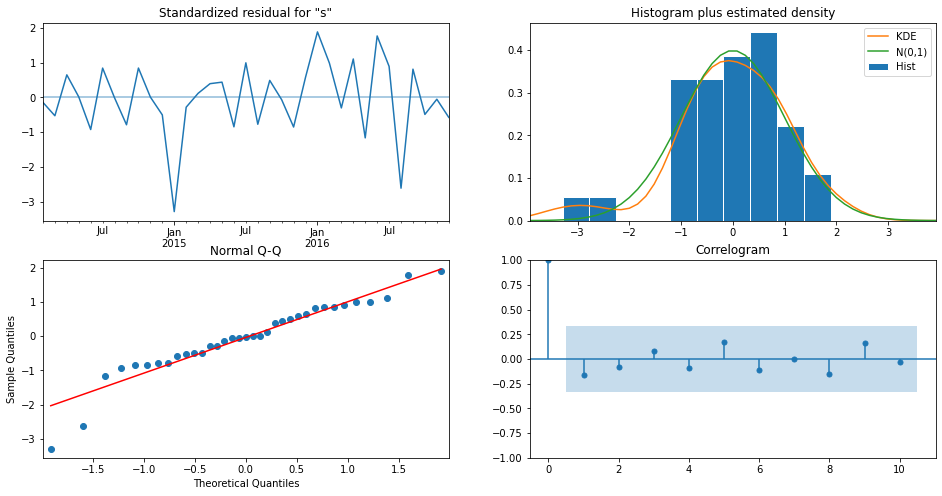

In [125]:
store1_result.plot_diagnostics(figsize=(16,8))
plt.show()

# Forecasting future values

In [126]:
start = len(store1_train)
end = len(store1_train) + len(store1_test) - 1

In [127]:
store1_prediction = store1_result.predict(start,end).rename('PREDICTION OF SARIMA')

In [128]:
store1_prediction

2017-01-31     -1898.776228
2017-02-28     14692.009646
2017-03-31    175335.872846
2017-04-30    113851.586504
2017-05-31     84298.293641
2017-06-30     37683.429499
2017-07-31    118572.642647
2017-08-31   -163608.587903
2017-09-30    -82696.340844
2017-10-31    -34321.904232
2017-11-30     27401.847390
2017-12-31   -229299.491820
Freq: M, Name: PREDICTION OF SARIMA, dtype: float64

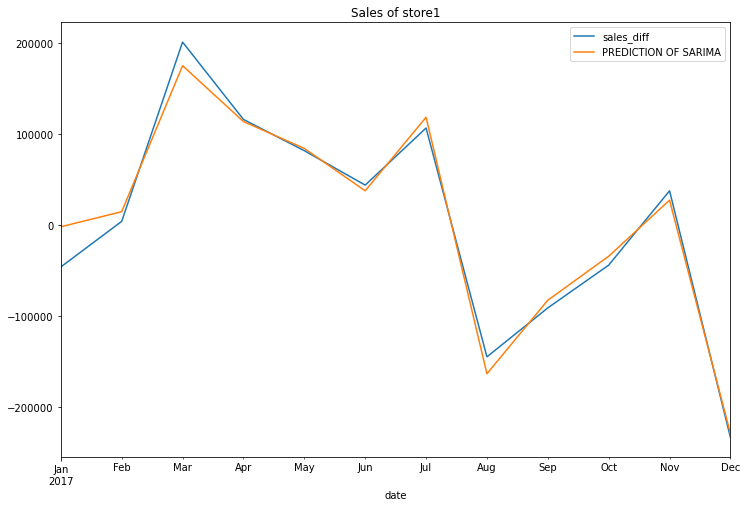

In [129]:
store1_test.plot(figsize=(12,8),legend=True)
store1_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

# Evaluation of Model

In [130]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse

In [131]:
mean_squared_error(store1_test,store1_prediction)

297460698.2519757

In [132]:
rmse(store1_test,store1_prediction)

array([116778.65252029, 117310.21134569, 208418.29119191, 161192.88483424,
       142420.48724469, 121836.66927559, 164485.3933299 , 203119.11617026,
       144568.35095541, 122406.13736147, 119287.11786866, 259645.09463894])

In [133]:
store1_test.mean()

sales_diff    2646.583333
dtype: float64

# 2018 sales forecating of store 1

In [134]:
store1_forecasted = SARIMAX(store1_m,order=(0, 0,0),seasonal_order=(1,1,0, 12),enforce_invertibility=False)

In [135]:
store1_forecasted = store1_forecasted.fit()

In [136]:
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

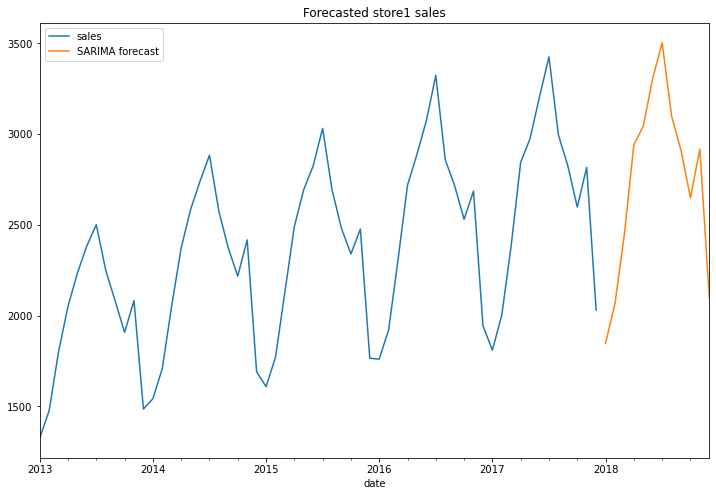

In [137]:
store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()

# Store 2 Model building

In [138]:
store2_train=model_data.iloc[:47]
store2_test=model_data.iloc[47:]

store2_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store2_model)
print(store2_model.summary())
store2_model

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1052.972, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1049.825, Time=0.06 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=1050.188, Time=0.06 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1051.127, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1054.981, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1051.396, Time=0.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=1050.614, Time=0.18 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=1050.358, Time=0.09 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=1052.446, Time=0.39 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=1048.044, Time=0.05 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1049.633, Time=0.26 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=1049.149, Time=0.19 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=1048.532, Time=0.04 sec
 ARIMA(0,0,0)(2,1,1)[12]

ARIMA(order=(0, 0, 0), scoring_args={}, seasonal_order=(1, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

                                      SARIMAX Results                                      
Dep. Variable:                          sales_diff   No. Observations:                   47
Model:             SARIMAX(0, 1, 1)x(1, 1, [], 12)   Log Likelihood                -378.827
Date:                             Fri, 17 Feb 2023   AIC                            763.654
Time:                                     12:28:13   BIC                            768.233
Sample:                                 02-28-2013   HQIC                           765.216
                                      - 12-31-2016                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9646      0.123     -7.846      0.000      -1.206      -0.724
ar.S.L12       0.1624      

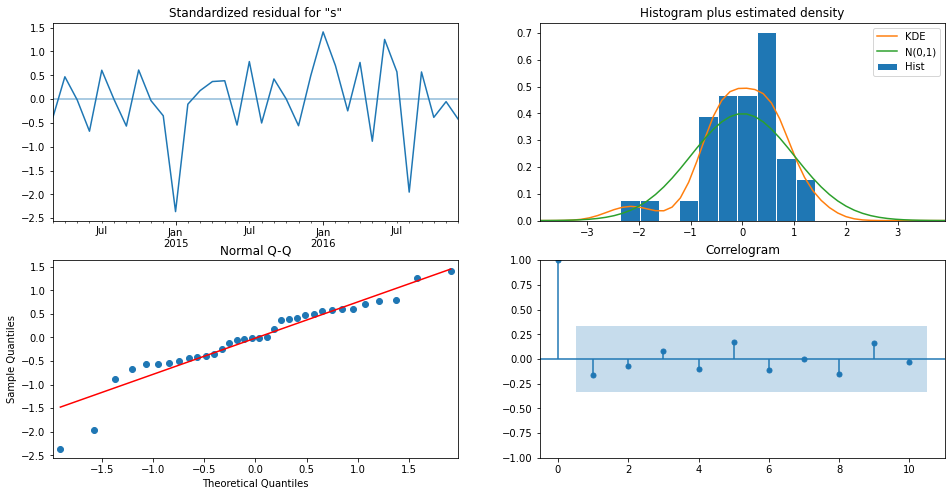

In [139]:
#model training
store2_model = SARIMAX(store2_train,order=(0, 1, 1),seasonal_order=(1,1, 0, 12),enforce_invertibility=False)
store2_result = store2_model.fit()
print(store2_result.summary())
store2_result.plot_diagnostics(figsize=(16,8))
plt.show()

2017-01-31     -1898.776228
2017-02-28     14692.009646
2017-03-31    175335.872846
2017-04-30    113851.586504
2017-05-31     84298.293641
2017-06-30     37683.429499
2017-07-31    118572.642647
2017-08-31   -163608.587903
2017-09-30    -82696.340844
2017-10-31    -34321.904232
2017-11-30     27401.847390
2017-12-31   -229299.491820
Freq: M, Name: PREDICTION OF SARIMA, dtype: float64


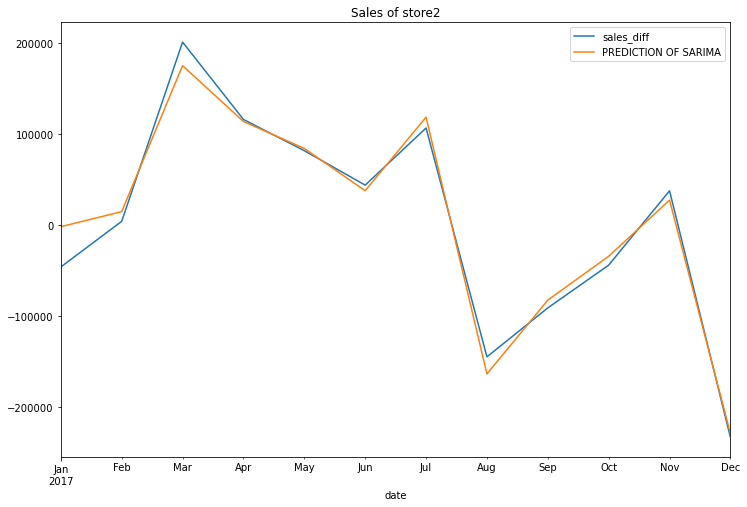

In [140]:
#forecasting with test 
start = len(store2_train)
end = len(store2_train) + len(store2_test) - 1
store2_prediction = store2_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store1_prediction)
store2_test.plot(figsize=(12,8),legend=True)
store2_prediction.plot(legend=True)
plt.title("Sales of store2")
plt.show()

In [116]:
#model evaluation
print("Mean sqaured error:",mean_squared_error(store2_test,store2_prediction))
print("RMSE:", rmse(store2_test,store2_prediction))
print("Store 2 test mean:",store2_test.mean())

Mean sqaured error: 298768543.3993018
RMSE: [116774.81258964 117317.84597506 208424.40717474 161254.18315617
 142398.48880992 121868.98156815 164543.51698629 203227.73793547
 144527.55977708 122407.84758028 119289.54776831 259653.05824525]
Store 2 test mean: sales_diff    2646.583333
dtype: float64


# 2018 sales forecating of store 2

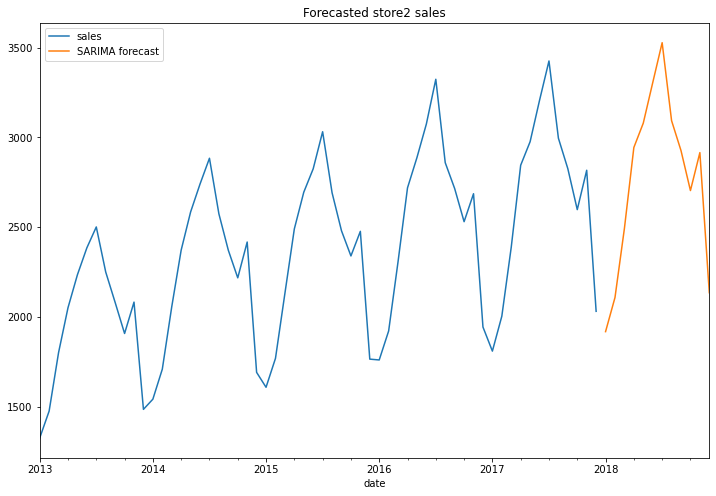

In [118]:
#forecast unkown future
store2_forecasted = SARIMAX(store2_m,order=(0, 1, 1),seasonal_order=(1,1, 0, 12),enforce_invertibility=False)
store2_forecasted = store2_forecasted.fit()
store2_out = store2_forecasted.predict(len(store2_m),len(store2_m)+11,typ='levels').rename('SARIMA forecast')

store2_m.plot(legend=True,figsize=(12,8))
store2_out.plot(legend=True)
plt.title("Forecasted store2 sales")
plt.show()


# Store 3 Model building

In [121]:
store3_train=model_data.iloc[:47]
store3_test=model_data.iloc[47:]

store3_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store3_model)
print(store3_model.summary())
store3_model

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1052.972, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1049.825, Time=0.05 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=1050.188, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1051.127, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1054.981, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1051.396, Time=0.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=1050.614, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=1050.358, Time=0.10 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=1052.446, Time=0.41 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=1048.044, Time=0.05 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1049.633, Time=0.28 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=1049.149, Time=0.17 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=1048.532, Time=0.06 sec
 ARIMA(0,0,0)(2,1,1)[12]

ARIMA(order=(0, 0, 0), scoring_args={}, seasonal_order=(1, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

                                SARIMAX Results                                 
Dep. Variable:               sales_diff   No. Observations:                   47
Model:             SARIMAX(1, 1, 0, 12)   Log Likelihood                -386.723
Date:                  Fri, 17 Feb 2023   AIC                            777.445
Time:                          12:44:18   BIC                            780.556
Sample:                      02-28-2013   HQIC                           778.519
                           - 12-31-2016                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.1585      0.073      2.179      0.029       0.016       0.301
sigma2      2.126e+08   4.61e-11   4.61e+18      0.000    2.13e+08    2.13e+08
Ljung-Box (L1) (Q):                 

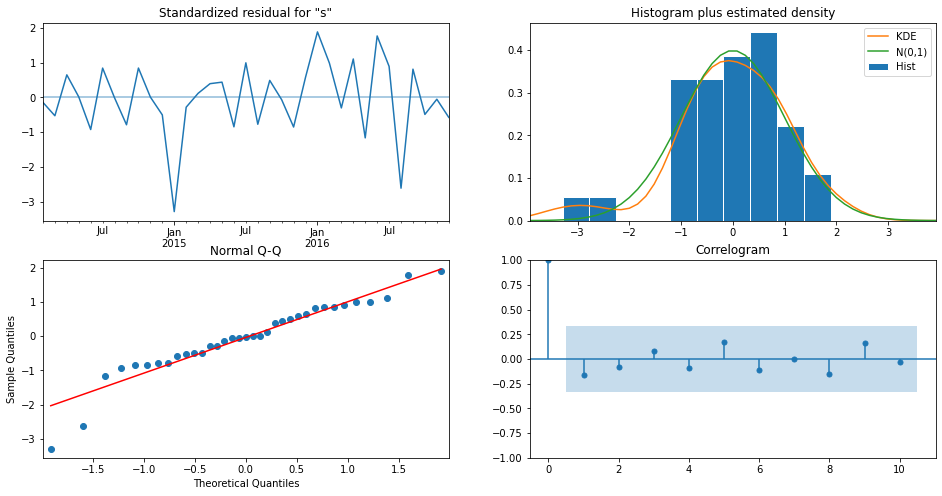

In [142]:
#model training
store3_model = SARIMAX(store1_train,order=(0, 0,0),seasonal_order=(1,1,0, 12),enforce_invertibility=False)
store3_result = store3_model.fit()
print(store1_result.summary())
store3_result.plot_diagnostics(figsize=(16,8))
plt.show()

2017-01-31     -1898.776228
2017-02-28     14692.009646
2017-03-31    175335.872846
2017-04-30    113851.586504
2017-05-31     84298.293641
2017-06-30     37683.429499
2017-07-31    118572.642647
2017-08-31   -163608.587903
2017-09-30    -82696.340844
2017-10-31    -34321.904232
2017-11-30     27401.847390
2017-12-31   -229299.491820
Freq: M, Name: PREDICTION OF SARIMA, dtype: float64


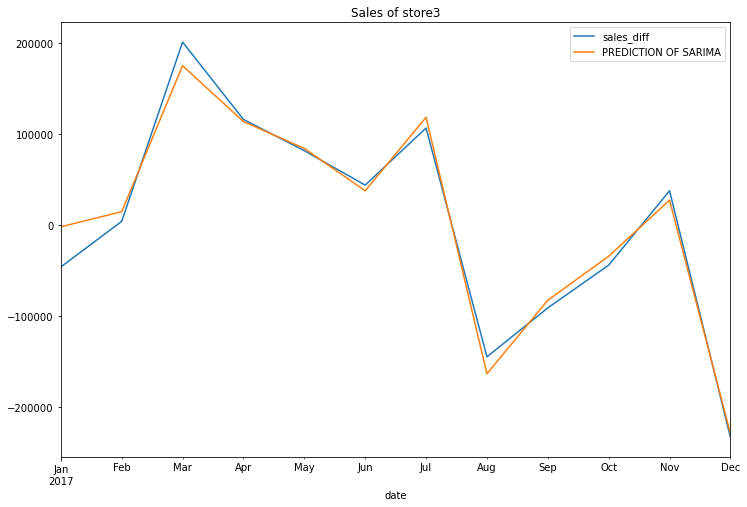

In [144]:
#forecasting with test 
start = len(store3_train)
end = len(store3_train) + len(store1_test) - 1
store3_prediction = store3_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store3_prediction)
store3_test.plot(figsize=(12,8),legend=True)
store3_prediction.plot(legend=True)
plt.title("Sales of store3")
plt.show()

In [145]:
#model evaluation
print(mean_squared_error(store3_test,store3_prediction))
print(rmse(store3_test,store3_prediction))
print(store3_test.mean())

297460698.2519757
[116778.65252029 117310.21134569 208418.29119191 161192.88483424
 142420.48724469 121836.66927559 164485.3933299  203119.11617026
 144568.35095541 122406.13736147 119287.11786866 259645.09463894]
sales_diff    2646.583333
dtype: float64


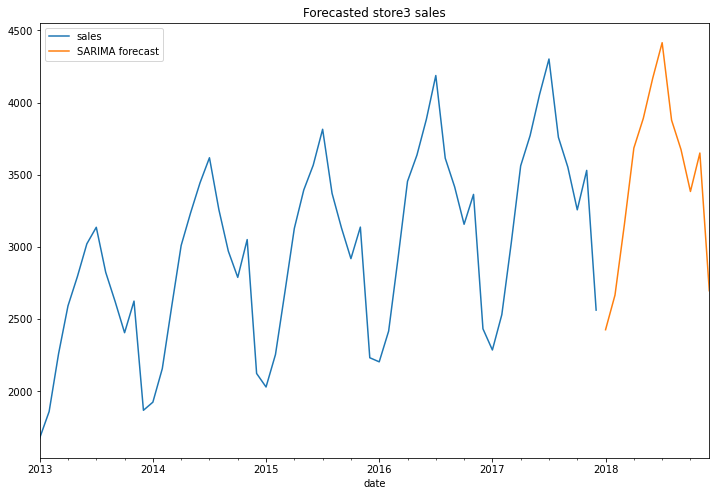

In [147]:
#forecast unkown future
store3_forecasted = SARIMAX(store3_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store3_forecasted = store3_forecasted.fit()
store3_out = store3_forecasted.predict(len(store3_m),len(store3_m)+11,typ='levels').rename('SARIMA forecast')

store3_m.plot(legend=True,figsize=(12,8))
store3_out.plot(legend=True)
plt.title("Forecasted store3 sales")
plt.show()


In [120]:
#store 4

In [ ]:
store4_train=model_data.iloc[:47]
store4_test=model_data.iloc[47:]

store4_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store4_model)
print(store4_model.summary())
store4_model


In [ ]:
#model training
store4_model = SARIMAX(store4_train,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store4_result = store4_model.fit()
print(store4_result.summary())
store4_result.plot_diagnostics(figsize=(16,8))
plt.show()

In [ ]:
#forecasting with test 
start = len(store4_train)
end = len(store4_train) + len(store4_test) - 1
store4_prediction = store4_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store4_prediction)
store4_test.plot(figsize=(12,8),legend=True)
store4_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

In [ ]:
#model evaluation
print(mean_squared_error(store4_test,store4_prediction))
print(rmse(store4_test,store4_prediction))
print(store4_test.mean())

In [ ]:
#forecast unkown future
store4_forecasted = SARIMAX(store4_m,order=(0, 0,0),seasonal_order=(1,1, 0, 12),enforce_invertibility=False)
store4_forecasted = store4_forecasted.fit()
store4_out = store4_forecasted.predict(len(store4_m),len(store4_m)+11,typ='levels').rename('SARIMA forecast')

store4_m.plot(legend=True,figsize=(12,8))
store4_out.plot(legend=True)
plt.title("Forecasted store4 sales")
plt.show()


# Store

In [ ]:
store4_train=model_data.iloc[:47]
store4_test=model_data.iloc[47:]

store4_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store4_model)
print(store4_model.summary())
store4_model


In [ ]:
#model training
store1_model = SARIMAX(store1_train,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_result = store1_model.fit()
print(store1_result.summary())
store1_result.plot_diagnostics(figsize=(16,8))
plt.show()

In [ ]:
#forecasting with test 
start = len(store1_train)
end = len(store1_train) + len(store1_test) - 1
store1_prediction = store1_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store1_prediction)
store1_test.plot(figsize=(12,8),legend=True)
store1_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

In [ ]:
#model evaluation
print(mean_squared_error(store1_test,store1_prediction))
print(rmse(store1_test,store1_prediction))
print(store1_test.mean())

In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
store1_train=model_data.iloc[:47]
store1_test=model_data.iloc[47:]

store1_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store1_model)
print(store1_model.summary())
store1_model


In [ ]:
#model training
store1_model = SARIMAX(store1_train,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_result = store1_model.fit()
print(store1_result.summary())
store1_result.plot_diagnostics(figsize=(16,8))
plt.show()

In [ ]:
#forecasting with test 
start = len(store1_train)
end = len(store1_train) + len(store1_test) - 1
store1_prediction = store1_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store1_prediction)
store1_test.plot(figsize=(12,8),legend=True)
store1_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

In [ ]:
#model evaluation
print(mean_squared_error(store1_test,store1_prediction))
print(rmse(store1_test,store1_prediction))
print(store1_test.mean())

In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
store1_train=model_data.iloc[:47]
store1_test=model_data.iloc[47:]

store1_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store1_model)
print(store1_model.summary())
store1_model


In [ ]:
#model training
store1_model = SARIMAX(store1_train,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_result = store1_model.fit()
print(store1_result.summary())
store1_result.plot_diagnostics(figsize=(16,8))
plt.show()

In [ ]:
#forecasting with test 
start = len(store1_train)
end = len(store1_train) + len(store1_test) - 1
store1_prediction = store1_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store1_prediction)
store1_test.plot(figsize=(12,8),legend=True)
store1_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

In [ ]:
#model evaluation
print(mean_squared_error(store1_test,store1_prediction))
print(rmse(store1_test,store1_prediction))
print(store1_test.mean())

In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
store1_train=model_data.iloc[:47]
store1_test=model_data.iloc[47:]

store1_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store1_model)
print(store1_model.summary())
store1_model


In [ ]:
#model training
store1_model = SARIMAX(store1_train,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_result = store1_model.fit()
print(store1_result.summary())
store1_result.plot_diagnostics(figsize=(16,8))
plt.show()

In [ ]:
#forecasting with test 
start = len(store1_train)
end = len(store1_train) + len(store1_test) - 1
store1_prediction = store1_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store1_prediction)
store1_test.plot(figsize=(12,8),legend=True)
store1_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

In [ ]:
#model evaluation
print(mean_squared_error(store1_test,store1_prediction))
print(rmse(store1_test,store1_prediction))
print(store1_test.mean())

In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
store1_train=model_data.iloc[:47]
store1_test=model_data.iloc[47:]

store1_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store1_model)
print(store1_model.summary())
store1_model


In [ ]:
#model training
store1_model = SARIMAX(store1_train,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_result = store1_model.fit()
print(store1_result.summary())
store1_result.plot_diagnostics(figsize=(16,8))
plt.show()

In [ ]:
#forecasting with test 
start = len(store1_train)
end = len(store1_train) + len(store1_test) - 1
store1_prediction = store1_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store1_prediction)
store1_test.plot(figsize=(12,8),legend=True)
store1_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

In [ ]:
#model evaluation
print(mean_squared_error(store1_test,store1_prediction))
print(rmse(store1_test,store1_prediction))
print(store1_test.mean())

In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
store1_train=model_data.iloc[:47]
store1_test=model_data.iloc[47:]

store1_model=auto_arima(model_data,m=12,seasonal=True,trace=True)
print(store1_model)
print(store1_model.summary())
store1_model


In [ ]:
#model training
store1_model = SARIMAX(store1_train,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_result = store1_model.fit()
print(store1_result.summary())
store1_result.plot_diagnostics(figsize=(16,8))
plt.show()

In [ ]:
#forecasting with test 
start = len(store1_train)
end = len(store1_train) + len(store1_test) - 1
store1_prediction = store1_result.predict(start,end).rename('PREDICTION OF SARIMA')
print(store1_prediction)
store1_test.plot(figsize=(12,8),legend=True)
store1_prediction.plot(legend=True)
plt.title("Sales of store1")
plt.show()

In [ ]:
#model evaluation
print(mean_squared_error(store1_test,store1_prediction))
print(rmse(store1_test,store1_prediction))
print(store1_test.mean())

In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()


In [ ]:
#forecast unkown future
store1_forecasted = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(2, 0, 0, 12),enforce_invertibility=False)
store1_forecasted = store1_forecasted.fit()
store1_out = store1_forecasted.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

store1_m.plot(legend=True,figsize=(12,8))
store1_out.plot(legend=True)
plt.title("Forecasted store1 sales")
plt.show()
